In [ ]:
import torch
import numpy as np
from torchvision import transforms

import matplotlib.pyplot as plt

from torch import nn
import torchvision.models as models

from torch.utils.data import DataLoader, Subset

from torch.utils.data import TensorDataset
import torchvision.transforms.functional as TF
import random
import torch.nn.functional as F   

from sklearn.model_selection import train_test_split


In [ ]:
SEED       = 42
ROT_MAX    = 30
TRANS_MAX  = 10
DO_AUG     = True 

torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

imgs, masks, labels = torch.load("saved_datasets/train/train.pt")
N = imgs.size(0)

if DO_AUG:
    aug_imgs, aug_masks, aug_lbls = [], [], []
    to_pil    = transforms.ToPILImage()
    to_tensor = transforms.ToTensor()

    for i in range(N):
        img, msk, lbl = imgs[i], masks[i], int(labels[i])
        angle = random.uniform(-ROT_MAX, ROT_MAX)
        tx    = random.uniform(-TRANS_MAX, TRANS_MAX)
        ty    = random.uniform(-TRANS_MAX, TRANS_MAX)

        img_p = to_pil(img)
        msk_p = to_pil(msk)
        img_a = TF.affine(img_p, angle, (tx,ty), scale=1, shear=0, fill=0)
        msk_a = TF.affine(msk_p, angle, (tx,ty), scale=1, shear=0, fill=0)

        aug_imgs.append(to_tensor(img_a))
        aug_masks.append(to_tensor(msk_a))
        aug_lbls.append(lbl)

    aug_imgs  = torch.stack(aug_imgs, dim=0)
    aug_masks = torch.stack(aug_masks, dim=0)
    aug_lbls  = torch.tensor(aug_lbls, dtype=torch.long)

    # ─── BUILD ’FULL’ TENSORS ────────────────────────────────────────────────
    all_imgs  = torch.cat([imgs,  aug_imgs],  dim=0)
    all_masks = torch.cat([masks, aug_masks], dim=0)
    all_lbls  = torch.cat([labels, aug_lbls],  dim=0)
    
    masks_squeezed = all_masks[:, 0, :, :]
    all_masks = torch.stack([
        masks_squeezed,
        masks_squeezed,
        masks_squeezed
    ], dim=1)

    print(f"Original: {N}, Augmented: {N}, Total: {len(all_imgs)}")

else:
    all_imgs  = imgs
    masks_squeezed = masks[:, 0, :, :]
    all_masks = torch.stack([
        masks_squeezed,
        masks_squeezed,
        masks_squeezed
    ], dim=1)
    all_lbls  = labels  # (N,)

    print(f"Original only: Total: {len(all_imgs)}")

full_ds = TensorDataset(all_imgs, all_masks, all_lbls)


Original: 1454, Augmented: 1454, Total: 2908


(100, 100, 3)
(100, 100, 3)
(100, 100, 3)
(100, 100, 3)
(100, 100, 3)
(100, 100, 3)


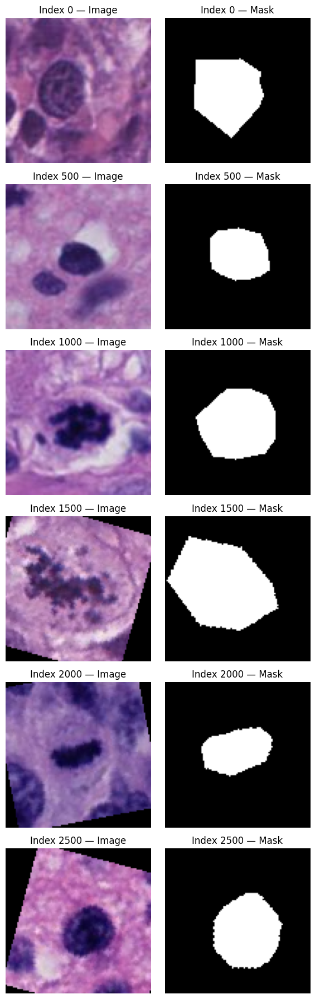

In [ ]:
indices = list(range(0, len(full_ds), 500))

rows = len(indices)
fig, axes = plt.subplots(rows, 2, figsize=(6, 3 * rows))

for i, idx in enumerate(indices):
    img, mask, _ = full_ds[idx]
    img_np = img.permute(1, 2, 0).cpu().numpy()
    print(img_np.shape)
    mask_np = mask[0].permute(0, 1).cpu().numpy() if mask.ndim == 4 else mask[0].cpu().numpy()

    ax_img, ax_msk = axes[i]
    ax_img.imshow(img_np)
    ax_img.set_title(f"Index {idx} — Image")
    ax_img.axis("off")

    ax_msk.imshow(mask_np, cmap="gray")
    ax_msk.set_title(f"Index {idx} — Mask")
    ax_msk.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
class Seq2MapBlock(nn.Module):
    """Wraps (B,N,C)->(B,N,C) blocks (e.g. External, UFO) onto conv maps (B,C,H,W)."""
    def __init__(self, block: nn.Module):
        super().__init__()
        self.block = block
    def forward(self, x):
        B, C, H, W = x.shape
        seq = x.flatten(2).transpose(1, 2)       # (B, H*W, C)
        out = self.block(seq)                  # (B, H*W, C)
        return out.transpose(1, 2).view(B, C, H, W)

class Seq3MapBlock(nn.Module):
    """Wraps a 3‑arg seq block (q,k,v)->(B,N,C) for conv maps."""
    def __init__(self, block: nn.Module):
        super().__init__()
        self.block = block
    def forward(self, x):
        B, C, H, W = x.shape
        seq = x.flatten(2).transpose(1, 2)    # (B, N=H*W, C)
        out = self.block(seq, seq, seq)      # (B, N, C)
        return out.transpose(1, 2).view(B, C, H, W)

class PermuteBlock(nn.Module):
    """Wraps (B,H,W,C)->(B,H,W,C) blocks (e.g. Outlook, ViP) onto conv maps."""
    def __init__(self, block: nn.Module):
        super().__init__()
        self.block = block
    def forward(self, x):
        y = x.permute(0, 2, 3, 1)              # (B,C,H,W) -> (B,H,W,C)
        y = self.block(y)                     # (B,H,W,C)
        return y.permute(0, 3, 1, 2)          # back to (B,C,H,W)

# ─── ResNet‑18 + four attention slots ────────────────────────────────────────────
class ResNetWithAttention(nn.Module):
    def __init__(self,
                 att1: nn.Module = None,
                 att2: nn.Module = None,
                 att3: nn.Module = None,
                 att4: nn.Module = None,
                 num_classes: int = 2):
        super().__init__()
        base = models.resnet18(weights=None)
        self.stem   = nn.Sequential(base.conv1, base.bn1, base.relu, base.maxpool)
        self.layer1 = base.layer1   # out ch=64
        self.layer2 = base.layer2   # out ch=128
        self.layer3 = base.layer3   # out ch=256
        self.layer4 = base.layer4   # out ch=512
        self.att1 = att1 or nn.Identity()
        self.att2 = att2 or nn.Identity()
        self.att3 = att3 or nn.Identity()
        self.att4 = att4 or nn.Identity()
        self.avg  = base.avgpool
        self.fc   = nn.Linear(base.fc.in_features, num_classes)
    def forward(self, x):
        x = self.stem(x)
        x = self.att1(self.layer1(x))
        x = self.att2(self.layer2(x))
        x = self.att3(self.layer3(x))
        x = self.att4(self.layer4(x))
        x = self.avg(x)
        x = torch.flatten(x, 1)
        return self.fc(x)

# ─── attention imports ───────────────────────────────────────────────────────────
from attention.ExternalAttention    import ExternalAttention
from attention.OutlookAttention     import OutlookAttention
from attention.CoTAttention         import CoTAttention
from attention.ParNetAttention      import ParNetAttention
from attention.UFOAttention         import UFOAttention
from attention.ACmixAttention       import ACmix
from attention.MobileViTv2Attention import MobileViTv2Attention
from attention.CBAM                 import CBAMBlock

# ─── 1) External Attention ResNet ────────────────────────────────────────────────
ext1 = Seq2MapBlock(ExternalAttention(d_model=64,  S=8))
ext2 = Seq2MapBlock(ExternalAttention(d_model=128, S=8))
# ext3 = Seq2MapBlock(ExternalAttention(d_model=256, S=8))
# ext4 = Seq2MapBlock(ExternalAttention(d_model=512, S=8))
model_external_1 = ResNetWithAttention(ext1, None, None, None)
model_external_2 = ResNetWithAttention(None, ext2, None, None)

# ─── 2) Outlook Attention ResNet ────────────────────────────────────────────────
out1 = PermuteBlock(OutlookAttention(dim=64,  num_heads=4, kernel_size=3, padding=1, stride=1))
out2 = PermuteBlock(OutlookAttention(dim=128, num_heads=4, kernel_size=3, padding=1, stride=1))
# out3 = PermuteBlock(OutlookAttention(dim=256, num_heads=4, kernel_size=3, padding=1, stride=1))
# out4 = PermuteBlock(OutlookAttention(dim=512, num_heads=4, kernel_size=3, padding=1, stride=1))
model_outlook_1 = ResNetWithAttention(out1, None, None, None)
model_outlook_2 = ResNetWithAttention(None, out2, None, None)

# ─── 3) CoTAttention ResNet ──────────────────────────────────────────────────────
cot1 = CoTAttention(dim=64)
cot2 = CoTAttention(dim=128)
# cot3 = CoTAttention(dim=256)
# cot4 = CoTAttention(dim=512)
model_cot_1 = ResNetWithAttention(cot1, None, None, None)
model_cot_2 = ResNetWithAttention(None, cot2, None, None)

# ─── 4) ParNet Attention ResNet ─────────────────────────────────────────────────
pnet1 = ParNetAttention(channel=64)
pnet2 = ParNetAttention(channel=128)
# pnet3 = ParNetAttention(channel=256)
# pnet4 = ParNetAttention(channel=512)
model_parnet_1 = ResNetWithAttention(pnet1, None, None, None)
model_parnet_2 = ResNetWithAttention(None, pnet2, None, None)

# ─── 5) UFO Attention ResNet ─────────────────────────────────────────────────────
ufo1 = Seq3MapBlock(UFOAttention(d_model=64,  d_k=8,  d_v=8,  h=8))
ufo2 = Seq3MapBlock(UFOAttention(d_model=128, d_k=16, d_v=16, h=8))
# ufo3 = Seq3MapBlock(UFOAttention(d_model=256, d_k=32, d_v=32, h=8))
# ufo4 = Seq3MapBlock(UFOAttention(d_model=512, d_k=64, d_v=64, h=8))
model_ufo_1 = ResNetWithAttention(ufo1, None, None, None)
model_ufo_2 = ResNetWithAttention(None, ufo2, None, None)

# ─── 6) ACmix Attention ResNet ───────────────────────────────────────────────────
ac1 = ACmix(in_planes=64,   out_planes=64)
ac2 = ACmix(in_planes=128,  out_planes=128)
# ac3 = ACmix(in_planes=256,  out_planes=256)
# ac4 = ACmix(in_planes=512,  out_planes=512)
model_acmix_1 = ResNetWithAttention(ac1, None, None, None)
model_acmix_2 = ResNetWithAttention(None, ac2, None, None)

# ─── 7) MobileViTv2 Attention ResNet ─────────────────────────────────────────────
mv1 = Seq2MapBlock(MobileViTv2Attention(d_model=64))
mv2 = Seq2MapBlock(MobileViTv2Attention(d_model=128))
# mv3 = Seq2MapBlock(MobileViTv2Attention(d_model=256))
# mv4 = Seq2MapBlock(MobileViTv2Attention(d_model=512))
model_mvitv2_1 = ResNetWithAttention(mv1, None, None, None)
model_mvitv2_2 = ResNetWithAttention(None, mv2, None, None)

# ─── 8) CBAM ResNet ─────────────────────────────────────────────────────────────
cb1 = CBAMBlock(channel=64,  reduction=16, kernel_size=7)
cb2 = CBAMBlock(channel=128, reduction=16, kernel_size=7)
# cb3 = CBAMBlock(channel=256, reduction=16, kernel_size=7)
# cb4 = CBAMBlock(channel=512, reduction=16, kernel_size=7)
model_cbam_1 = ResNetWithAttention(cb1, None, None, None)
model_cbam_2 = ResNetWithAttention(None, cb2, None, None)


In [73]:
class ResNet18SegGlobalAttn(nn.Module):  # 1)
    def __init__(self, num_classes=2, fuse_after=[1]):
        super().__init__()
        assert len(fuse_after) < 5
        for x in fuse_after:
            assert x in {1, 2, 3, 4}
        base = models.resnet18(weights=None)

        self.stem   = nn.Sequential(base.conv1, base.bn1, base.relu, base.maxpool)
        self.layer1 = base.layer1
        self.layer2 = base.layer2
        self.layer3 = base.layer3
        self.layer4 = base.layer4
        self.avg    = base.avgpool
        self.fc     = nn.Linear(512, num_classes)

        self.fuse_after = fuse_after

    def fuse(self, F_map, S_map):
        B, C, H, W = F_map.shape
        F_flat = F_map.view(B, C, -1)
        A_flat = S_map.view(B, 1, -1)
        attn   = torch.softmax(A_flat, dim=-1)

        v = torch.bmm(F_flat, attn.transpose(1, 2)).view(B, C, 1, 1)
        return F_map + v

    def forward(self, x_img, x_mask):
        f = self.stem(x_img)
        s = x_mask
        if s.shape[1] != 1:
            s = s.mean(dim=1, keepdim=True)

        f = self.layer1(f)
        if 1 in self.fuse_after:
            f = self.fuse(f, F.interpolate(s, size=f.shape[-2:], mode='bilinear', align_corners=False))

        f = self.layer2(f)
        if 2 in self.fuse_after:
            f = self.fuse(f, F.interpolate(s, size=f.shape[-2:], mode='bilinear', align_corners=False))

        f = self.layer3(f)
        if 3 in self.fuse_after:
            f = self.fuse(f, F.interpolate(s, size=f.shape[-2:], mode='bilinear', align_corners=False))

        f = self.layer4(f)
        if 4 in self.fuse_after:
            f = self.fuse(f, F.interpolate(s, size=f.shape[-2:], mode='bilinear', align_corners=False))

        f = self.avg(f)
        return self.fc(torch.flatten(f, 1))


class ResNet18SegSpatialAttention(nn.Module):  # 2) layer 1
    def __init__(self, num_classes=2):
        super().__init__()
        base = models.resnet18(weights=None)
        self.stem = nn.Sequential(base.conv1, base.bn1, base.relu, base.maxpool)
        self.layer1 = base.layer1
        self.layer2 = base.layer2
        self.layer3 = base.layer3
        self.layer4 = base.layer4
        self.avg = base.avgpool
        self.fc = nn.Linear(512, num_classes)

        self.attn_conv = nn.Conv2d(1, 1, kernel_size=3, padding=1)

    def forward(self, x_img, x_mask):
        if x_mask.shape[1] != 1:
            x_mask = x_mask.mean(dim=1, keepdim=True)

        f = self.stem(x_img)
        f = self.layer1(f)
        s = F.interpolate(x_mask, size=f.shape[-2:], mode="bilinear", align_corners=False)
        attn = torch.sigmoid(self.attn_conv(s))
        f = f + f * attn

        f = self.layer2(f)
        f = self.layer3(f)
        f = self.layer4(f)
        f = self.avg(f)
        return self.fc(torch.flatten(f, 1))


class ResNet18SegSpatialAttention2(nn.Module):  # 2) layer 2
    def __init__(self, num_classes=2):
        super().__init__()
        base = models.resnet18(weights=None)
        self.stem = nn.Sequential(base.conv1, base.bn1, base.relu, base.maxpool)
        self.layer1 = base.layer1
        self.layer2 = base.layer2
        self.layer3 = base.layer3
        self.layer4 = base.layer4
        self.avg = base.avgpool
        self.fc = nn.Linear(512, num_classes)

        self.attn_conv = nn.Conv2d(1, 1, kernel_size=3, padding=1)

    def forward(self, x_img, x_mask):
        if x_mask.shape[1] != 1:
            x_mask = x_mask.mean(dim=1, keepdim=True)

        f = self.stem(x_img)
        f = self.layer1(f)
        f = self.layer2(f)
        s = F.interpolate(x_mask, size=f.shape[-2:], mode="bilinear", align_corners=False)
        attn = torch.sigmoid(self.attn_conv(s))
        f = f + f * attn

        f = self.layer3(f)
        f = self.layer4(f)
        f = self.avg(f)
        return self.fc(torch.flatten(f, 1))


class ResNet18SoftSpatialAttention(nn.Module):  # 3) layer 1
    def __init__(self, num_classes=2):
        super().__init__()
        base = models.resnet18(weights=None)
        self.stem = nn.Sequential(base.conv1, base.bn1, base.relu, base.maxpool)
        self.layer1 = base.layer1
        self.layer2 = base.layer2
        self.layer3 = base.layer3
        self.layer4 = base.layer4
        self.avg = base.avgpool
        self.fc = nn.Linear(512, num_classes)

    def forward(self, x_img, x_mask):
        if x_mask.shape[1] != 1:
            x_mask = x_mask.mean(dim=1, keepdim=True)

        f = self.stem(x_img)
        f = self.layer1(f)

        s = F.interpolate(x_mask, size=f.shape[-2:], mode='bilinear', align_corners=False)
        s = torch.sigmoid(s)
        f = f + f * s

        f = self.layer2(f)
        f = self.layer3(f)
        f = self.layer4(f)
        f = self.avg(f)
        return self.fc(torch.flatten(f, 1))


class ResNet18SoftSpatialAttention2(nn.Module):  # 3) layer 2
    def __init__(self, num_classes=2):
        super().__init__()
        base = models.resnet18(weights=None)
        self.stem = nn.Sequential(base.conv1, base.bn1, base.relu, base.maxpool)
        self.layer1 = base.layer1
        self.layer2 = base.layer2
        self.layer3 = base.layer3
        self.layer4 = base.layer4
        self.avg = base.avgpool
        self.fc = nn.Linear(512, num_classes)

    def forward(self, x_img, x_mask):
        if x_mask.shape[1] != 1:
            x_mask = x_mask.mean(dim=1, keepdim=True)

        f = self.stem(x_img)
        f = self.layer1(f)
        f = self.layer2(f)

        s = F.interpolate(x_mask, size=f.shape[-2:], mode='bilinear', align_corners=False)
        s = torch.sigmoid(s)
        f = f + f * s

        f = self.layer3(f)
        f = self.layer4(f)
        f = self.avg(f)
        return self.fc(torch.flatten(f, 1))


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models.mobilenetv3 import mobilenet_v3_small

class MobileNetV3SmallSegGlobalAttn(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        base = mobilenet_v3_small(weights=None)

        # ─── decompose ───────────────────────────────────────────────
        self.conv_stem  = base.features[0]
        self.ir1        = base.features[1]
        self.ir1.block.pop(1) # pops SE
        self.ir2        = base.features[2]
        self.ir3        = base.features[3]
        self.ir4        = base.features[4]
        self.ir4.block.pop(2) # pops SE
        self.tail       = nn.Sequential(*base.features[5:12])
        self.conv_final = base.features[12]
        self.avgpool    = base.avgpool

        cls            = list(base.classifier)
        cls[3]         = nn.Linear(cls[3].in_features, num_classes)
        self.classifier = nn.Sequential(*cls)

    def fuse(self, F_map: torch.Tensor, S_map: torch.Tensor) -> torch.Tensor:
        B, C, H, W = F_map.shape
        F_flat = F_map.view(B, C, -1)
        A_flat = S_map.view(B, 1, -1)
        attn   = torch.softmax(A_flat, dim=-1)
        v      = torch.bmm(F_flat, attn.transpose(1,2)).view(B, C, 1, 1)
        return F_map + v

    def forward(self, x_img, x_mask):
        # prepare mask
        s = x_mask
        if s.shape[1] != 1:
            s = s.mean(1, keepdim=True)

        # stem
        f = self.conv_stem(x_img)

        # ── Block 1 with in‐block fuse ───────────────────────────
        res1 = f
        # depthwise conv
        f1 = self.ir1.block[0](f)
        # fuse takes place of SE
        m1 = F.interpolate(s, size=f1.shape[-2:], mode='bilinear', align_corners=False)
        f1 = self.fuse(f1, m1)
        # pointwise conv
        f1 = self.ir1.block[1](f1)
        if self.ir1.use_res_connect:
            f = f1 + res1
        else:
            f = f1

        # ── Blocks 2 & 3 normally ────────────────────────────────
        f = self.ir2(f)
        f = self.ir3(f)

        # ── Block 4 with in‐block fuse ───────────────────────────
        res4 = f
        f4_0 = self.ir4.block[0](f)
        f4_1 = self.ir4.block[1](f4_0)
        m4   = F.interpolate(s, size=f4_1.shape[-2:], mode='bilinear', align_corners=False)
        f4_p = self.fuse(f4_1, m4)
        f4_2 = self.ir4.block[2](f4_p)
        if self.ir4.use_res_connect:
            f = f4_2 + res4
        else:
            f = f4_2

        # ── Tail & head ─────────────────────────────────────────
        f = self.tail(f)
        f = self.conv_final(f)
        f = self.avgpool(f)
        return self.classifier(torch.flatten(f, 1))


class MobileNetV3SmallSegSpatialAttn(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        base = mobilenet_v3_small(weights=None)

        self.conv_stem  = base.features[0]
        self.ir1        = base.features[1]
        self.ir1.block.pop(1)
        self.ir2        = base.features[2]
        self.ir3        = base.features[3]
        self.ir4        = base.features[4]
        self.ir4.block.pop(2)
        self.tail       = nn.Sequential(*base.features[5:12])
        self.conv_final = base.features[12]
        self.avgpool    = base.avgpool

        cls            = list(base.classifier)
        cls[3]         = nn.Linear(cls[3].in_features, num_classes)
        self.classifier = nn.Sequential(*cls)

        self.attn_conv = nn.Conv2d(1, 1, kernel_size=3, padding=1)

    def forward(self, x_img, x_mask):
        s = x_mask
        if s.shape[1] != 1:
            s = s.mean(1, keepdim=True)

        f = self.conv_stem(x_img)

        # Block 1
        res1 = f
        f1   = self.ir1.block[0](f)
        m1   = F.interpolate(s, size=f1.shape[-2:], mode='bilinear', align_corners=False)
        attn = torch.sigmoid(self.attn_conv(m1))
        f1   = f1 + f1 * attn
        f1   = self.ir1.block[1](f1)
        f    = f1 + res1 if self.ir1.use_res_connect else f1

        # Blocks 2 & 3
        f = self.ir2(f)
        f = self.ir3(f)

        # Block 4
        res4 = f
        f4_0 = self.ir4.block[0](f)
        f4_1 = self.ir4.block[1](f4_0)
        m4   = F.interpolate(s, size=f4_1.shape[-2:], mode='bilinear', align_corners=False)
        attn = torch.sigmoid(self.attn_conv(m4))
        f4_p = f4_1 + f4_1 * attn
        f4_2 = self.ir4.block[2](f4_p)
        f    = f4_2 + res4 if self.ir4.use_res_connect else f4_2

        # Tail & head
        f = self.tail(f)
        f = self.conv_final(f)
        f = self.avgpool(f)
        return self.classifier(torch.flatten(f, 1))


# ────────────────────────────────────────────────────────────────────
# 3) Soft Spatial Attention (like ResNet18SoftSpatialAttention)
# ────────────────────────────────────────────────────────────────────
class MobileNetV3SmallSegSoftAttn(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        base = mobilenet_v3_small(weights=None)

        self.conv_stem  = base.features[0]
        self.ir1        = base.features[1]
        self.ir1.block.pop(1)
        self.ir2        = base.features[2]
        self.ir3        = base.features[3]
        self.ir4        = base.features[4]
        self.ir4.block.pop(2)
        self.tail       = nn.Sequential(*base.features[5:12])
        self.conv_final = base.features[12]
        self.avgpool    = base.avgpool

        cls            = list(base.classifier)
        cls[3]         = nn.Linear(cls[3].in_features, num_classes)
        self.classifier = nn.Sequential(*cls)

    def forward(self, x_img, x_mask):
        s = x_mask
        if s.shape[1] != 1:
            s = s.mean(1, keepdim=True)

        f = self.conv_stem(x_img)

        # Block 1
        res1 = f
        f1   = self.ir1.block[0](f)
        m1   = F.interpolate(s, size=f1.shape[-2:], mode='bilinear', align_corners=False)
        attn = torch.sigmoid(m1)
        f1   = f1 + f1 * attn
        f1   = self.ir1.block[1](f1)
        f    = f1 + res1 if self.ir1.use_res_connect else f1

        # Blocks 2 & 3
        f = self.ir2(f)
        f = self.ir3(f)

        # Block 4
        res4 = f
        f4_0 = self.ir4.block[0](f)
        f4_1 = self.ir4.block[1](f4_0)
        m4   = F.interpolate(s, size=f4_1.shape[-2:], mode='bilinear', align_corners=False)
        attn = torch.sigmoid(m4)
        f4_p = f4_1 + f4_1 * attn
        f4_2 = self.ir4.block[2](f4_p)
        f    = f4_2 + res4 if self.ir4.use_res_connect else f4_2

        # Tail & head
        f = self.tail(f)
        f = self.conv_final(f)
        f = self.avgpool(f)
        return self.classifier(torch.flatten(f, 1))

from torchvision.models.mobilenetv3 import mobilenet_v3_small

class MobileNetV3SmallGlobalAttnFull(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        base = mobilenet_v3_small(weights=None)

        # ─── decompose ───────────────────────────────────────────────
        self.conv_stem  = base.features[0]     # 16×112×112

        # IR1: pop SE (idx=1)
        self.ir1        = base.features[1]
        self.ir1.block.pop(1)

        # IR2 & IR3 (no SE)
        self.ir2        = base.features[2]
        self.ir3        = base.features[3]

        # IR4: pop SE (idx=2)
        self.ir4        = base.features[4]
        self.ir4.block.pop(2)

        # IR5–IR11: pop SE (idx=2) in each
        self.ir5        = base.features[5];  self.ir5.block.pop(2)
        self.ir6        = base.features[6];  self.ir6.block.pop(2)
        self.ir7        = base.features[7];  self.ir7.block.pop(2)
        self.ir8        = base.features[8];  self.ir8.block.pop(2)
        self.ir9        = base.features[9];  self.ir9.block.pop(2)
        self.ir10       = base.features[10]; self.ir10.block.pop(2)
        self.ir11       = base.features[11]; self.ir11.block.pop(2)

        # head conv + pool
        self.conv_final = base.features[12]    # 160→576
        self.avgpool    = base.avgpool        # →576×1×1

        # classifier
        cls            = list(base.classifier)
        cls[3]         = nn.Linear(cls[3].in_features, num_classes)
        self.classifier = nn.Sequential(*cls)

    def fuse(self, F_map: torch.Tensor, S_map: torch.Tensor) -> torch.Tensor:
        B, C, H, W = F_map.shape
        F_flat = F_map.view(B, C, -1)
        A_flat = S_map.view(B, 1, -1)
        attn   = torch.softmax(A_flat, dim=-1)
        v      = torch.bmm(F_flat, attn.transpose(1,2)).view(B, C, 1, 1)
        return F_map + v

    def forward(self, x_img, x_mask):
        # prepare single-channel mask
        s = x_mask
        if s.shape[1] != 1:
            s = s.mean(1, keepdim=True)

        # ── stem ─────────────────────────────────────────────────────
        f = self.conv_stem(x_img)

        # ── IR1 (dw → fuse → pw + skip)────────────────────────────
        res1 = f
        f1_0 = self.ir1.block[0](f)
        m1   = F.interpolate(s, size=f1_0.shape[-2:], mode='bilinear', align_corners=False)
        f1_p = self.fuse(f1_0, m1)
        f1_1 = self.ir1.block[1](f1_p)
        f    = f1_1 + res1 if self.ir1.use_res_connect else f1_1

        # ── IR2 & IR3 (no fuse)─────────────────────────────────────
        f = self.ir2(f)
        f = self.ir3(f)

        # ── IR4 (conv0 → conv1 → fuse → conv2 + skip)─────────────
        res4 = f
        f4_0 = self.ir4.block[0](f)
        f4_1 = self.ir4.block[1](f4_0)
        m4   = F.interpolate(s, size=f4_1.shape[-2:], mode='bilinear', align_corners=False)
        f4_p = self.fuse(f4_1, m4)
        f4_2 = self.ir4.block[2](f4_p)
        f    = f4_2 + res4 if self.ir4.use_res_connect else f4_2

        # ── IR5 (dw → fuse → pw + skip)────────────────────────────
        res5 = f
        f5_0 = self.ir5.block[0](f)
        f5_1 = self.ir5.block[1](f5_0)
        m5   = F.interpolate(s, size=f5_1.shape[-2:], mode='bilinear', align_corners=False)
        f5_p = self.fuse(f5_1, m5)
        f5_2 = self.ir5.block[2](f5_p)
        f    = f5_2 + res5 if self.ir5.use_res_connect else f5_2

        # ── IR6 (dw → fuse → pw + skip)────────────────────────────
        res6 = f
        f6_0 = self.ir6.block[0](f)
        f6_1 = self.ir6.block[1](f6_0)
        m6   = F.interpolate(s, size=f6_1.shape[-2:], mode='bilinear', align_corners=False)
        f6_p = self.fuse(f6_1, m6)
        f6_2 = self.ir6.block[2](f6_p)
        f    = f6_2 + res6 if self.ir6.use_res_connect else f6_2

        # ── IR7 (dw → fuse → pw + skip)────────────────────────────
        res7 = f
        f7_0 = self.ir7.block[0](f)
        f7_1 = self.ir7.block[1](f7_0)
        m7   = F.interpolate(s, size=f7_1.shape[-2:], mode='bilinear', align_corners=False)
        f7_p = self.fuse(f7_1, m7)
        f7_2 = self.ir7.block[2](f7_p)
        f    = f7_2 + res7 if self.ir7.use_res_connect else f7_2

        # ── IR8 (dw → fuse → pw + skip)────────────────────────────
        res8 = f
        f8_0 = self.ir8.block[0](f)
        f8_1 = self.ir8.block[1](f8_0)
        m8   = F.interpolate(s, size=f8_1.shape[-2:], mode='bilinear', align_corners=False)
        f8_p = self.fuse(f8_1, m8)
        f8_2 = self.ir8.block[2](f8_p)
        f    = f8_2 + res8 if self.ir8.use_res_connect else f8_2

        # ── IR9 (dw → fuse → pw + skip)────────────────────────────
        res9 = f
        f9_0 = self.ir9.block[0](f)
        f9_1 = self.ir9.block[1](f9_0)
        m9   = F.interpolate(s, size=f9_1.shape[-2:], mode='bilinear', align_corners=False)
        f9_p = self.fuse(f9_1, m9)
        f9_2 = self.ir9.block[2](f9_p)
        f    = f9_2 + res9 if self.ir9.use_res_connect else f9_2

        # ── IR10 (dw → fuse → pw + skip)───────────────────────────
        res10 = f
        f10_0 = self.ir10.block[0](f)
        f10_1 = self.ir10.block[1](f10_0)
        m10   = F.interpolate(s, size=f10_1.shape[-2:], mode='bilinear', align_corners=False)
        f10_p = self.fuse(f10_1, m10)
        f10_2 = self.ir10.block[2](f10_p)
        f     = f10_2 + res10 if self.ir10.use_res_connect else f10_2

        # ── IR11 (dw → fuse → pw + skip)───────────────────────────
        res11 = f
        f11_0 = self.ir11.block[0](f)
        f11_1 = self.ir11.block[1](f11_0)
        m11    = F.interpolate(s, size=f11_1.shape[-2:], mode='bilinear', align_corners=False)
        f11_p  = self.fuse(f11_1, m11)
        f11_2  = self.ir11.block[2](f11_p)
        f      = f11_2 + res11 if self.ir11.use_res_connect else f11_2

        # ── head ─────────────────────────────────────────────────────
        f = self.conv_final(f)
        f = self.avgpool(f)
        return self.classifier(torch.flatten(f, 1))



In [75]:
res_global_attention_no_a_1 = ResNet18SegGlobalAttn(fuse_after=[1])
res_global_attention_no_a_2 = ResNet18SegGlobalAttn(fuse_after=[2])
res_global_attention_no_a_23 = ResNet18SegGlobalAttn(fuse_after=[2,3])
res_seg_spatial_no_a_1 = ResNet18SegSpatialAttention()
res_seg_spatial_no_a_2 = ResNet18SegSpatialAttention2()
res_soft_spatial_no_a  = ResNet18SoftSpatialAttention()
res_soft_spatial_no_a_2 = ResNet18SoftSpatialAttention2()

In [76]:
models_list = [
    # ("external_1", model_external_1,False),
    # ("external_2", model_external_2,False),
    # ("outlook_1",  model_outlook_1,False),
    # ("outlook_2",  model_outlook_2,False),
    # ("cot_1",      model_cot_1,False),
    # ("cot_2",      model_cot_2,False),
    # ("parnet_1",   model_parnet_1,False),
    # ("parnet_2",   model_parnet_2,False),
    # ("ufo_1",      model_ufo_1,False),
    # ("ufo_2",      model_ufo_2,False),
    # ("acmix_1",    model_acmix_1,False),
    # ("acmix_2",    model_acmix_2,False),
    # ("mvitv2_1",   model_mvitv2_1,False),
    # ("mvitv2_2",   model_mvitv2_2,False),
    # ("cbam_1",     model_cbam_1,False),
    # ("cbam_2",     model_cbam_2,False),
    # ("plain_resnet",     ResNetWithAttention(None, None, None, None),False),
    # ("res_global_attention_no_a_1", res_global_attention_no_a_1,True),
    # ("res_global_attention_no_a_2", res_global_attention_no_a_2,True),
    # ("res_global_attention_no_a_23", res_global_attention_no_a_23,True),
    # ("res_seg_spatial_no_a_1", res_seg_spatial_no_a_1,True),
    # ("res_seg_spatial_no_a_2", res_seg_spatial_no_a_2,True),
    # ("res_soft_spatial_no_a", res_soft_spatial_no_a,True),
    # ("res_soft_spatial_no_a_2", res_soft_spatial_no_a_2,True),
]

# disable inplace ReLUs
for name, model, flag in models_list:
    for module in model.modules():
        if isinstance(module, torch.nn.ReLU):
            module.inplace = False

# now iterate over YOUR list, not torchvision.models
x = torch.randn(1,3,100,100)
x_mask = torch.randn(1,3,100,100)

for name, m, flag in models_list:
    if not flag:
        y = m(x)
    else:
        y = m(x,x_mask)
    print(f"{name:12s} → {y.shape}")

In [77]:
# ─── helper: disable any in-place ReLUs ───────────────────────────────
def disable_inplace_relu(m: nn.Module):
    for module in m.modules():
        if isinstance(module, nn.ReLU):
            module.inplace = False

# ─── SE → attention replacer ───────────────────────────────────────────
def replace_SE_with(m: nn.Module, build_attn):
    for child_name, child in list(m.named_children()):
        # detect by class‐name
        if child.__class__.__name__ == "SqueezeExcitation":
            C = child.fc2.out_channels
            new = build_attn(C)
            setattr(m, child_name, new)
        else:
            replace_SE_with(child, build_attn)

# ─── our “builders” list ───────────────────────────────────────────────
builders = [
#     ("plain",        None,                             False),
#     ("external",     lambda c: Seq2MapBlock(ExternalAttention(d_model=c, S=8)), False),
#     ("outlook",      lambda c: PermuteBlock(OutlookAttention(dim=c, num_heads=4,
#                                                               kernel_size=3,
#                                                               padding=1,
#                                                               stride=1)),    False),
#     ("cot",          lambda c: CoTAttention(dim=c),     False),
#     ("parnet",       lambda c: ParNetAttention(channel=c), False),
#     ("ufo",          lambda c: Seq3MapBlock(UFOAttention(d_model=c, d_k=8, d_v=8, h=8)), False),
#     ("acmix",        lambda c: ACmix(in_planes=c, out_planes=c), False),
#     ("mvitv2",       lambda c: Seq2MapBlock(MobileViTv2Attention(d_model=c)), False),
#     ("cbam",         lambda c: CBAMBlock(channel=c, reduction=16, kernel_size=7), False),
#     ("mnet_global_attention_no_a",  MobileNetV3SmallSegGlobalAttn,     True),
    ("mnet_seg_spatial_no_a", MobileNetV3SmallSegSpatialAttn,    True),
#     ("mnet_soft_spatial_no_a",    MobileNetV3SmallSegSoftAttn,       True),
    # ("mnet_guided_att",  MobileNetV3SmallGlobalAttnFull,    True),
]

# ─── quick forward‐shape test ──────────────────────────────────────────
x      = torch.randn(1,3,100,100)
x_mask = torch.randn(1,3,100,100)
for name, builder, needs_mask in builders:
    if builder is None:
        mdl = mobilenet_v3_small(weights=None)
        disable_inplace_relu(mdl)
        mdl.classifier[3] = nn.Linear(mdl.classifier[3].in_features, 2)
    elif needs_mask and isinstance(builder, type):
        mdl = builder(num_classes=2)
    else:
        mdl = mobilenet_v3_small(weights=None)
        disable_inplace_relu(mdl)
        replace_SE_with(mdl.features, builder)
        mdl.classifier[3] = nn.Linear(mdl.classifier[3].in_features, 2)
    out = mdl(x, x_mask) if needs_mask else mdl(x)
    print(f"{name:15s} → {tuple(out.shape)}")


mnet_seg_spatial_no_a → (1, 2)


In [78]:
# ─── HOLD-OUT TEST SPLIT ──────────────────────────────────────────────────────
BATCH_SIZE = 128
# LR         = 5e-7 for resnet, 2000ep
# LR         = 5e-6
LR = 1e-7   # resnet 1000, best
EPOCHS     = 550
# EPOCHS     = 1000
FOLDS      = 5
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUT_DIR    = "runs_our_550"
# OUT_DIR    = "cv_runs_mobile"
# OUT_DIR    = "cv_runs"
SAVE_EPOCHS = {}
# SAVE_EPOCHS = {100,300,500}
# SAVE_EPOCHS = {100,500,800,1000}

all_idx       = np.arange(len(full_ds))
trainval_idx, test_idx = train_test_split(
    all_idx, test_size=0.1, random_state=SEED, stratify=all_lbls.numpy()
)

test_loader = DataLoader(
    Subset(full_ds, test_idx),
    batch_size=len(test_idx),
    shuffle=False
)

for batch in test_loader:
    print(len(batch[0]))

291


In [79]:
# # ─── K-FOLD ON REMAINING 90% ─────────────────────────────────────────────────
# kf        = KFold(n_splits=FOLDS, shuffle=True, random_state=SEED)
# criterion = nn.CrossEntropyLoss()


# # ─── TRAIN/VAL/TEST LOOP ─────────────────────────────────────────────────────
# # for name, prototype, use_mask in models_list:
# for name, prototype, use_mask in models_list:
#     model_dir = os.path.join(OUT_DIR, name)
#     os.makedirs(model_dir, exist_ok=True)
#     print(f"\n=== {name} ===")
#     i = 0
#     for fold, (tr_f, va_f) in enumerate(kf.split(trainval_idx), 1):
#         # i += 1
#         # print(i)
#         # if i >= 2:
#         #     continue
#         tr_idx = trainval_idx[tr_f]
#         va_idx = trainval_idx[va_f]

#         print(f"-- Fold {fold}/{FOLDS} sizes: "
#           f"train={len(tr_idx)}  val={len(va_idx)}  test={len(test_idx)}")

#         tr_loader = DataLoader(Subset(full_ds, tr_idx),
#                                batch_size=BATCH_SIZE, shuffle=True)
#         va_loader = DataLoader(Subset(full_ds, va_idx),
#                                batch_size=len(va_idx), shuffle=False)

#         # fresh copy for each fold
#         model     = copy.deepcopy(prototype).to(DEVICE)
#         optimizer = optim.Adam(model.parameters(), lr=LR)
#         best_val  = 0.0
#         history   = []

#         for ep in range(1, EPOCHS+1):
#             # — TRAIN —
#             model.train()
#             run_loss = run_corr = run_n = 0
#             for batch in tr_loader:
#                 if use_mask:
#                     x, x_mask, y = batch
#                     x, x_mask, y = x.to(DEVICE), x_mask.to(DEVICE), y.to(DEVICE)
#                     out = model(x, x_mask)
#                 else:
#                     x, _, y     = batch
#                     x, y        = x.to(DEVICE), y.to(DEVICE)
#                     out = model(x)

#                 loss = criterion(out, y)
#                 optimizer.zero_grad()
#                 loss.backward()
#                 optimizer.step()

#                 bs = x.size(0)
#                 run_loss += loss.item() * bs
#                 run_corr += (out.argmax(1) == y).sum().item()
#                 run_n   += bs

#             tr_loss = run_loss/run_n
#             tr_acc  = run_corr/run_n

#             # — VALIDATION —
#             model.eval()
#             corr = tot = 0
#             with torch.no_grad():
#                 for batch in va_loader:
#                     if use_mask:
#                         x, x_mask, y = batch
#                         x, x_mask, y = x.to(DEVICE), x_mask.to(DEVICE), y.to(DEVICE)
#                         out = model(x, x_mask)
#                     else:
#                         x, _, y = batch
#                         x, y    = x.to(DEVICE), y.to(DEVICE)
#                         out = model(x)
        
#                     corr += (out.argmax(1)==y).sum().item()
#                     tot  += x.size(0)

#             val_acc = corr/tot
#             history.append((ep, tr_loss, tr_acc, val_acc))
#             print(f"Ep{ep:03d} tr_acc={tr_acc:.4f} tr_loss={tr_loss:.4f} val={val_acc:.4f}",end="\r")

#             if ep in SAVE_EPOCHS:
#                 torch.save(
#                     model.state_dict(),
#                     os.path.join(model_dir, f"fold{fold}_epoch{ep}.pth")
#                 )

#             if val_acc > best_val:
#                 best_val = val_acc
#                 torch.save(model.state_dict(),
#                            os.path.join(model_dir, f"fold{fold}_best.pth"))

#         print(f"\n→ Fold {fold} best-val={best_val:.4f}")

#         # save history
#         with open(os.path.join(model_dir, f"fold{fold}_history.csv"), "w", newline="") as f:
#             writer = csv_mod.writer(f)
#             writer.writerow(["epoch","train_loss","train_acc","val_acc"])
#             writer.writerows(history)

#          # — FINAL TEST ON HOLD-OUT —
#         model.load_state_dict(torch.load(
#             os.path.join(model_dir, f"fold{fold}_best.pth")))
#         model.eval()
#         corr = tot = 0
#         with torch.no_grad():
#             for batch in test_loader:
#                 if use_mask:
#                     x, x_mask, y = batch
#                     x, x_mask, y = x.to(DEVICE), x_mask.to(DEVICE), y.to(DEVICE)
#                     out = model(x, x_mask)
#                 else:
#                     x, _, y     = batch
#                     x, y        = x.to(DEVICE), y.to(DEVICE)
#                     out = model(x)

#                 corr += (out.argmax(1) == y).sum().item()
#                 tot  += x.size(0)

#         test_acc = corr/tot
#         print(f"→ Fold {fold} test-acc={test_acc:.4f}")

#         del model, optimizer
#         torch.cuda.empty_cache()

#         # break # ONLY DO ONE FOLD
        


In [80]:
model_factory = {
    "res_guided_1":res_global_attention_no_a_1,
    "res_guided_2":res_global_attention_no_a_2,
    "res_guided_23":res_global_attention_no_a_23,
    "res_seg_spatial_1":res_seg_spatial_no_a_1,
    "res_seg_spatial_2":res_seg_spatial_no_a_2,
    # "res_soft_spatial_no_a":res_soft_spatial_no_a,
    # "res_soft_spatial_no_a_2":res_soft_spatial_no_a_2,
    "external_1": model_external_1, "external_2": model_external_2,
    "outlook_1":  model_outlook_1,  "outlook_2":  model_outlook_2,
    "cot_1":      model_cot_1,      "cot_2":      model_cot_2,
    "parnet_1":   model_parnet_1,   "parnet_2":   model_parnet_2,
    "ufo_1":      model_ufo_1,      "ufo_2":      model_ufo_2,
    "acmix_1":    model_acmix_1,    "acmix_2":    model_acmix_2,
    "mvitv2_1":   model_mvitv2_1,   "mvitv2_2":   model_mvitv2_2,
    "cbam_1":     model_cbam_1,     "cbam_2":     model_cbam_2,
    "plain_resnet": ResNetWithAttention(None,None,None,None)
}

In [81]:
# import os
# import torch
# import pandas as pd
# import copy
# from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# # Loop over all models and evaluate
# def evaluate(dirrr):
#     summary = []
#     for model_name in sorted(os.listdir(dirrr)):
        
#         if model_name == '.ipynb_checkpoints':
#             continue
    
#         val = 0
#         best_fold = ""
#         for f in ['fold1', 'fold2', 'fold3', 'fold4', 'fold5']:
#             history_path = os.path.join(dirrr, model_name, f'{f}_history.csv')
#             if not os.path.exists(history_path):
#                 continue
#             fh = pd.read_csv(history_path)
#             curr_best = fh['val_acc'].max()
#             if curr_best > val:
#                 val = curr_best
#                 best_fold = f
    
#         print(round(val,2), best_fold, model_name)
    
#         model_path = os.path.join(dirrr, model_name, f'{best_fold}_best.pth')
    
#         if model_name not in model_factory:
#             print(f"Skipping model {model_name} — no constructor found.")
#             continue
    
#         model = copy.deepcopy(model_factory[model_name])
#         model.load_state_dict(torch.load(model_path))
#         model.eval()
    
#         y_true, y_pred = [], []
#         with torch.no_grad():
#             for img, mask, lbl in test_loader:
#                 try:
#                     logits = model(img)
#                 except:
#                     logits = model(img,mask)
#                 preds = torch.argmax(logits, dim=1)
#                 y_true.extend(lbl.numpy())
#                 y_pred.extend(preds.numpy())
    
#         precision = precision_score(y_true, y_pred)
#         recall    = recall_score(y_true, y_pred)
#         f1        = f1_score(y_true, y_pred)
#         accuracy  = accuracy_score(y_true, y_pred)
    
#         summary.append({
#             'model_name': model_name,
#             'fold': best_fold,
#             'acc': round(accuracy,2),
#             'prec': round(precision,2),
#             'rec': round(recall,2),
#             'f1': round(f1,2)
#         })
    
#     # Save to CSV
#     summary_df = pd.DataFrame(summary)
#     # summary_df.to_csv('best_models_testqqqqs.csv', index=False)
#     print(summary_df)


In [52]:
import os
import torch
import pandas as pd
import copy
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def evaluate(dirrr):
    summary = []
    for model_name in sorted(os.listdir(dirrr)):
        if model_name == '.ipynb_checkpoints':
            continue
        if model_name not in model_factory:
            print(f"Skipping model {model_name} — no constructor found.")
            continue

        # For each fold, evaluate on test set and record its test accuracy
        best_stats = None
        for f in ['fold1', 'fold2', 'fold3', 'fold4', 'fold5']:
            model_path = os.path.join(dirrr, model_name, f'{f}_best.pth')
            if not os.path.exists(model_path):
                continue

            # load model
            model = copy.deepcopy(model_factory[model_name])
            model.load_state_dict(torch.load(model_path))
            model.eval()

            # run test set
            y_true, y_pred = [], []
            with torch.no_grad():
                for img, mask, lbl in test_loader:
                    try:
                        logits = model(img)
                    except TypeError:
                        logits = model(img, mask)
                    preds = torch.argmax(logits, dim=1)
                    y_true.extend(lbl.numpy())
                    y_pred.extend(preds.numpy())

            acc   = accuracy_score(y_true, y_pred)
            prec  = precision_score(y_true, y_pred)
            rec   = recall_score(y_true, y_pred)
            f1    = f1_score(y_true, y_pred)

            stats = {
                'fold': f,
                'acc': acc,
                'prec': prec,
                'rec': rec,
                'f1': f1
            }
            # keep the fold with the highest test accuracy
            if best_stats is None or stats['acc'] > best_stats['acc']:
                best_stats = stats

        if best_stats is not None:
            # round for readability
            summary.append({
                'model_name': model_name,
                'fold':      best_stats['fold'],
                'acc':       round(best_stats['acc'],  2),
                'prec':      round(best_stats['prec'], 2),
                'rec':       round(best_stats['rec'],  2),
                'f1':        round(best_stats['f1'],   2)
            })

    df = pd.DataFrame(summary)
    print(df)
    # df.to_csv('best_models_by_test.csv', index=False)


In [16]:
evaluate('runs_resnet_550')

0.7903780068728522
0.8041237113402062
0.8075601374570447
0.8041237113402062
0.8075601374570447
0.81 fold3 acmix_1



KeyboardInterrupt



In [ ]:
evaluate('runs_resnet_1000')

In [ ]:
import os, random, numpy as np, torch, pandas as pd
from torch import nn
from torch.utils.data import TensorDataset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torchvision.models import mobilenet_v3_small

# ─── 1) Load data & hold-out split ────────────────────────────────────────────
imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")
full_ds = TensorDataset(imgs, masks, labels)
indices = np.arange(len(full_ds))

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ─── 2) Define builders list ──────────────────────────────────────────────────
builders = [
    ("plain",        None, False),
    ("external",     lambda c: Seq2MapBlock(ExternalAttention(d_model=c, S=8)), False),
    ("outlook",      lambda c: PermuteBlock(OutlookAttention(dim=c, num_heads=4,
                                                             kernel_size=3, padding=1,
                                                             stride=1)), False),
    ("cot",          lambda c: CoTAttention(dim=c), False),
    ("parnet",       lambda c: ParNetAttention(channel=c), False),
    ("ufo",          lambda c: Seq3MapBlock(UFOAttention(d_model=c, d_k=8,
                                                          d_v=8, h=8)), False),
    ("acmix",        lambda c: ACmix(in_planes=c, out_planes=c), False),
    ("mvitv",       lambda c: Seq2MapBlock(MobileViTv2Attention(d_model=c)), False),
    ("cbam",         lambda c: CBAMBlock(channel=c, reduction=16, kernel_size=7), False),
    ("mnet_global",  MobileNetV3SmallSegGlobalAttn, True),
    ("mnet_seg_spatial", MobileNetV3SmallSegSpatialAttn, True),
    ("mnet_soft_spatial",    MobileNetV3SmallSegSoftAttn, True),
    ("mnet_guided",  MobileNetV3SmallGlobalAttnFull, True),
]

model_factory_mobile, needs_mask = {}, {}
for key, builder, flag in builders:
    if builder is None:
        mdl = mobilenet_v3_small(weights=None)
        disable_inplace_relu(mdl)
        mdl.classifier[3] = nn.Linear(mdl.classifier[3].in_features, 2)
    elif flag and isinstance(builder, type):
        mdl = builder(num_classes=2)
    else:
        mdl = mobilenet_v3_small(weights=None)
        disable_inplace_relu(mdl)
        replace_SE_with(mdl.features, builder)
        mdl.classifier[3] = nn.Linear(mdl.classifier[3].in_features, 2)
    model_factory_mobile[key] = mdl.to(device)
    needs_mask[key]    = flag

def evaluate_all(root_dir):
    summary = []
    for model_name in sorted(os.listdir(root_dir)):
        if model_name.startswith("."):
            continue

        # 1) find best fold for this model
        best_val, best_fold = -1.0, None
        for f in range(1, 6):
            hist = os.path.join(root_dir, model_name, f"fold{f}_history.csv")
            if not os.path.exists(hist):
                continue
            m = pd.read_csv(hist)["val_acc"].max()
            if m >= best_val:
                best_val, best_fold = m, f
        if best_fold is None:
            print(f"[WARN] no history for {model_name}")
            continue

        # 2) pick the right factory key
        if model_name in model_factory_mobile:
            key = model_name
        else:
            # try startswith
            cands = [k for k in model_factory_mobile if model_name.startswith(k)]
            # try endswith
            if not cands:
                cands = [k for k in model_factory_mobile if model_name.endswith(k)]
            # try containment
            if not cands:
                cands = [k for k in model_factory_mobile if k in model_name]
            if  not cands:
                print(f"[WARN] missing factory for {model_name}")
                continue
            # if multiple, pick longest key
            key = max(cands, key=len)

        # 3) load the best‐fold checkpoint
        ckpt = os.path.join(root_dir, model_name, f"fold{best_fold}_best.pth")
        model = copy.deepcopy(model_factory_mobile[key]).to(device)
        model.load_state_dict(torch.load(ckpt, map_location=device))
        model.eval()

        # 4) run on your hold‐out test_loader
        y_true, y_pred = [], []
        with torch.no_grad():
            for batch in test_loader:
                if needs_mask.get(key, False):
                    x, msk, lbl = batch
                    logits = model(x.to(device), msk.to(device))
                else:
                    x, lbl = batch[0].to(device), batch[-1]
                    logits = model(x)
                preds = logits.argmax(1).cpu().tolist()
                y_pred.extend(preds)
                y_true.extend(lbl.tolist())

        # 5) compute metrics
        acc  = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, zero_division=0)
        rec  = recall_score(y_true, y_pred, zero_division=0)
        f1   = f1_score(y_true, y_pred, zero_division=0)

        summary.append({
            "model":   key,
            "best_fold": best_fold,
            "val_acc":   round(best_val,3),
            "test_acc":  round(acc,3),
            "precision": round(prec,3),
            "recall":    round(rec,3),
            "f1":        round(f1,3),
        })

    df = pd.DataFrame(summary)
    print(df)
    # df.to_csv("all_models_test_results.csv", index=False)



# ─── 6) Run Evaluation ───────────────────────────────────────────────────────
evaluate_all("runs_mobile_1000")   # adjust to your top-level runs directory


                model  best_fold  val_acc  test_acc  precision  recall     f1
0               acmix          4    0.686     0.911      0.955   0.863  0.906
1                cbam          3    0.717     0.904      0.915   0.890  0.903
2                 cot          3    0.614     0.822      0.797   0.863  0.829
3            external          5    0.514     0.500      0.500   1.000  0.667
4         mnet_global          2    0.740     0.897      0.892   0.904  0.898
5         mnet_guided          5    0.771     0.932      0.932   0.932  0.932
6    mnet_seg_spatial          1    0.771     0.932      0.909   0.959  0.933
7   mnet_soft_spatial          4    0.774     0.925      0.919   0.932  0.925
8               mvitv          5    0.514     0.500      0.500   1.000  0.667
9             outlook          5    0.908     0.959      0.986   0.932  0.958
10             parnet          5    0.683     0.938      0.944   0.932  0.938
11              plain          3    0.700     0.904      0.873  

In [86]:
import os
import copy
import torch
import numpy as np
import pandas as pd
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score
)

# ------------------------------------------------------------------
# 1)  PARAMETERS / FACTORY / TEST_LOADER already defined elsewhere
# ------------------------------------------------------------------
base_dir      = "runs_resnet_1000"     # root containing model sub‑folders
# base_dir      = "runs_resnet"     # root containing model sub‑folders
output_csv    = "folds_avg_results_se.csv"

# model_factory : dict {model_name: lambda()->fresh model}  – must exist
# test_loader   : your fixed hold‑out DataLoader             – must exist
# ------------------------------------------------------------------

results = []

for model_name in sorted(os.listdir(base_dir)):
    # skip checkpoints folder and any model not in the factory
    if model_name.startswith(".") or model_name not in model_factory:
        continue
    print(model_name)

    model_subdir = os.path.join(base_dir, model_name)
    val_accs, accs, precs, recs, f1s = [], [], [], [], []

    for fold_num in range(1, 6):
        fold        = f"fold{fold_num}"
        hist_path   = os.path.join(model_subdir, f"{fold}_history.csv")
        ckpt_path   = os.path.join(model_subdir, f"{fold}_best.pth")

        if not (os.path.exists(hist_path) and os.path.exists(ckpt_path)):
            continue

        # -------- read best val‑accuracy for that fold -----------
        val_acc = pd.read_csv(hist_path)["val_acc"].max()
        val_accs.append(val_acc)

        # -------- fresh model, load weights ----------------------
        model = model_factory[model_name]
        model.load_state_dict(torch.load(ckpt_path, map_location="cpu"))
        model.eval()

        # -------- inference on test split -----------------------
        y_true, y_pred = [], []
        with torch.no_grad():
            for img, mask, lbl in test_loader:
                try:
                    preds = torch.argmax(model(img), dim=1)
                except:
                    preds = torch.argmax(model(img,mask), dim=1)
                y_true.extend(lbl.numpy())
                y_pred.extend(preds.numpy())

        # -------- metrics for this fold -------------------------
        accs.append( accuracy_score (y_true, y_pred) )
        precs.append( precision_score(y_true, y_pred, zero_division=0) )
        recs.append(  recall_score  (y_true, y_pred, zero_division=0) )
        f1s.append(   f1_score      (y_true, y_pred, zero_division=0) )
        

    if len(f1s) == 0:      # no valid folds
        continue

    K  = len(f1s)                          # number of folds actually processed
    def mean_se(arr):
        arr = np.array(arr)
        mu  = arr.mean()
        se  = arr.std(ddof=1) / np.sqrt(K) # standard error
        return mu, se

    # ---------- compute mean ± SE for each metric ---------------
    bestfold = np.argmax(accs)
    # ---------- pick the fold with the highest test accuracy  ---------------
    best_idx = int(np.argmax(accs))    # 0-based index into accs[]
    bestfold = best_idx + 1            # convert to 1-based fold number

    row = {
        "name":model_name,
        "Best fold":  bestfold,
        "Acc":        round(accs[best_idx],  2),
        "Precision":  round(precs[best_idx], 2),
        "Recall":     round(recs[best_idx],  2),
        "F1-score":   round(f1s[best_idx],   2),
    }
    results.append(row)

# ------------------------------------------------------------------
# 3)  SAVE TO CSV
# ------------------------------------------------------------------
df = pd.DataFrame(results)
print(df)
# df.to_csv(output_csv, index=False)
print(f"✅  results saved to {output_csv}")


acmix_1
acmix_2
cbam_1
cbam_2
cot_1
cot_2
external_1
external_2
mvitv2_1
mvitv2_2
outlook_1
outlook_2
parnet_1
parnet_2
plain_resnet
res_guided_1
res_guided_2
res_guided_23
res_seg_spatial_1
res_seg_spatial_2
ufo_1
ufo_2
                 name  Best fold   Acc  Precision  Recall  F1-score
0             acmix_1          1  0.85       0.86    0.83      0.85
1             acmix_2          2  0.88       0.89    0.87      0.88
2              cbam_1          2  0.85       0.83    0.86      0.85
3              cbam_2          1  0.85       0.85    0.86      0.85
4               cot_1          5  0.79       0.79    0.79      0.79
5               cot_2          2  0.80       0.79    0.83      0.81
6          external_1          5  0.88       0.90    0.86      0.88
7          external_2          2  0.90       0.91    0.90      0.90
8            mvitv2_1          3  0.93       0.94    0.92      0.93
9            mvitv2_2          2  0.90       0.91    0.90      0.90
10          outlook_1          

In [ ]:
import os
import copy
import torch
import numpy as np
import pandas as pd
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score
)

# ------------------------------------------------------------------
# 1)  PARAMETERS / FACTORY / TEST_LOADER already defined elsewhere
# ------------------------------------------------------------------
base_dir      = "runs_resnet_1000"     # root containing model sub‑folders
# base_dir      = "runs_resnet"     # root containing model sub‑folders
output_csv    = "folds_avg_results_se.csv"

# model_factory : dict {model_name: lambda()->fresh model}  – must exist
# test_loader   : your fixed hold‑out DataLoader             – must exist
# ------------------------------------------------------------------

results = []

for model_name in sorted(os.listdir(base_dir)):
    # skip checkpoints folder and any model not in the factory
    if model_name.startswith(".") or model_name not in model_factory:
        continue
    print(model_name)

    model_subdir = os.path.join(base_dir, model_name)
    val_accs, accs, precs, recs, f1s = [], [], [], [], []

    for fold_num in range(1, 6):
        fold        = f"fold{fold_num}"
        hist_path   = os.path.join(model_subdir, f"{fold}_history.csv")
        ckpt_path   = os.path.join(model_subdir, f"{fold}_best.pth")

        if not (os.path.exists(hist_path) and os.path.exists(ckpt_path)):
            continue

        # -------- read best val‑accuracy for that fold -----------
        val_acc = pd.read_csv(hist_path)["val_acc"].max()
        val_accs.append(val_acc)

        # -------- fresh model, load weights ----------------------
        model = model_factory[model_name]
        model.load_state_dict(torch.load(ckpt_path, map_location="cpu"))
        model.eval()

        # -------- inference on test split -----------------------
        y_true, y_pred = [], []
        with torch.no_grad():
            for img, mask, lbl in test_loader:
                try:
                    preds = torch.argmax(model(img), dim=1)
                except:
                    preds = torch.argmax(model(img,mask), dim=1)
                y_true.extend(lbl.numpy())
                y_pred.extend(preds.numpy())

        # -------- metrics for this fold -------------------------
        accs.append( accuracy_score (y_true, y_pred) )
        precs.append( precision_score(y_true, y_pred, zero_division=0) )
        recs.append(  recall_score  (y_true, y_pred, zero_division=0) )
        f1s.append(   f1_score      (y_true, y_pred, zero_division=0) )
        

    if len(f1s) == 0:      # no valid folds
        continue

    K  = len(f1s)                          # number of folds actually processed
    def mean_se(arr):
        arr = np.array(arr)
        mu  = arr.mean()
        se  = arr.std(ddof=1) / np.sqrt(K) # standard error
        return mu, se

    # ---------- compute mean ± SE for each metric ---------------
    acc_mu,  acc_se  = mean_se(accs)
    prec_mu, prec_se = mean_se(precs)
    rec_mu,  rec_se  = mean_se(recs)
    f1_mu,   f1_se   = mean_se(f1s)
    val_mu           = np.mean(val_accs)   # val_acc used only as mean

    # ---------- format as "mean ± SE" strings -------------------
    fmt = lambda mu, se: f"{mu:.2f} ± {se:.3f}"
    row = {
        "Model name":          model_name,
        "Mean val_acc":        f"{val_mu:.2f}",
        "Acc":           f"{acc_mu:.2f}",
        "Precision":     f"{prec_mu:.2f}",
        "Recall":        f"{rec_mu:.2f}",
        "F-score ± S.E":       fmt(f1_mu,f1_se)
    }
    # print(val_accs)
    # print(accs)
    # print(precs)
    # print(recs)
    # print(f1s)
    # print(row)
    results.append(row)

# ------------------------------------------------------------------
# 3)  SAVE TO CSV
# ------------------------------------------------------------------
df = pd.DataFrame(results)
print(df)
# df.to_csv(output_csv, index=False)
print(f" results saved to {output_csv}")


In [96]:
# ──────────────────────────────────────────────────────────────────────────────
# CELL: Build, load best checkpoints, and evaluate all attention-MobileNet variants
# ──────────────────────────────────────────────────────────────────────────────

import os, random, numpy as np, torch, pandas as pd
import torchvision.transforms.functional as TF
from torch import nn
from torch.utils.data import TensorDataset, DataLoader, Subset
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torchvision.models import mobilenet_v3_small
# Import your attention modules/builders here:

# # ─── 1) Load data & hold-out split ────────────────────────────────────────────
# imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")
# full_ds = TensorDataset(imgs, masks, labels)
# indices = np.arange(len(full_ds))

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ─── 2) Define builders list ──────────────────────────────────────────────────
builders = [
    ("plain",        None, False),
    ("external",     lambda c: Seq2MapBlock(ExternalAttention(d_model=c, S=8)), False),
    ("outlook",      lambda c: PermuteBlock(OutlookAttention(dim=c, num_heads=4,
                                                             kernel_size=3, padding=1,
                                                             stride=1)), False),
    ("cot",          lambda c: CoTAttention(dim=c), False),
    ("parnet",       lambda c: ParNetAttention(channel=c), False),
    ("ufo",          lambda c: Seq3MapBlock(UFOAttention(d_model=c, d_k=8,
                                                          d_v=8, h=8)), False),
    ("acmix",        lambda c: ACmix(in_planes=c, out_planes=c), False),
    ("mvitv",       lambda c: Seq2MapBlock(MobileViTv2Attention(d_model=c)), False),
    ("cbam",         lambda c: CBAMBlock(channel=c, reduction=16, kernel_size=7), False),
    ("mnet_global",  MobileNetV3SmallSegGlobalAttn, True),
    ("mnet_seg_spatial", MobileNetV3SmallSegSpatialAttn, True),
    ("mnet_soft_spatial",    MobileNetV3SmallSegSoftAttn, True),
    ("mnet_guided",  MobileNetV3SmallGlobalAttnFull, True),
]

model_factory_mobile, needs_mask = {}, {}
for key, builder, flag in builders:
    if builder is None:
        mdl = mobilenet_v3_small(weights=None)
        disable_inplace_relu(mdl)
        mdl.classifier[3] = nn.Linear(mdl.classifier[3].in_features, 2)
    elif flag and isinstance(builder, type):
        mdl = builder(num_classes=2)
    else:
        mdl = mobilenet_v3_small(weights=None)
        disable_inplace_relu(mdl)
        replace_SE_with(mdl.features, builder)
        mdl.classifier[3] = nn.Linear(mdl.classifier[3].in_features, 2)
    model_factory_mobile[key] = mdl.to(device)
    needs_mask[key]    = flag

def evaluate_all_with_se(root_dir):
    rows = []
    # helper to compute mean and standard error
    def mean_se(a):
        arr = np.array(a)
        mu  = arr.mean()
        se  = arr.std(ddof=1) / np.sqrt(len(arr))
        return mu, se

    for model_name in sorted(os.listdir(root_dir)):
        if model_name.startswith("."):
            continue

        # collect per-fold lists
        val_list, acc_list, prec_list, rec_list, f1_list = [], [], [], [], []

        # step 1: find best fold & collect per-fold metrics
        for f in range(1, 6):
            hist = os.path.join(root_dir, model_name, f"fold{f}_history.csv")
            ckpt = os.path.join(root_dir, model_name, f"fold{f}_best.pth")
            if not (os.path.exists(hist) and os.path.exists(ckpt)):
                continue

            # load and eval model exactly as you had it
            key   = model_name if model_name in model_factory_mobile else max(
                        [k for k in model_factory_mobile if 
                         model_name.startswith(k) or model_name.endswith(k) or k in model_name],
                        key=len
                    )
            model = copy.deepcopy(model_factory_mobile[key]).to(device)
            model.load_state_dict(torch.load(ckpt, map_location=device))
            model.eval()

            # hold-out inference
            y_true, y_pred = [], []
            with torch.no_grad():
                for batch in test_loader:
                    if needs_mask.get(key, False):
                        x, msk, lbl = batch
                        logits = model(x.to(device), msk.to(device))
                    else:
                        x, lbl = batch[0].to(device), batch[-1]
                        logits = model(x)
                    preds = logits.argmax(1).cpu().tolist()
                    y_pred.extend(preds)
                    y_true.extend(lbl.tolist())

            # compute fold metrics
            if model_name =='mnet_seg_spatial':
                print(accuracy_score (y_true, y_pred))
            acc_list.append( accuracy_score (y_true, y_pred) )
            prec_list.append( precision_score(y_true, y_pred, zero_division=0) )
            rec_list.append(  recall_score  (y_true, y_pred, zero_division=0) )
            f1_list.append(   f1_score      (y_true, y_pred, zero_division=0) )

        # if no folds ran, skip
        if not acc_list:
            continue
        
        # find the fold with the highest training accuracy
        best_idx = int(np.argmax(acc_list))
    
        # grab its metrics
        best_fold_name = f"fold{best_idx+1}"
        best_test_acc  = acc_list[best_idx]
        best_test_prec = prec_list[best_idx]
        best_test_rec  = rec_list[best_idx]
        best_test_f1   = f1_list[best_idx]
    
        # now just report that single row
        rows.append({
            "Model name": model_name,
            "Best fold":  best_fold_name,
            "Acc":  f"{acc_list[best_idx]:.2f}",
            # "Val Acc":    f"{best_val_acc:.2f}",
            # "Test Acc":   f"{best_test_acc:.2f}",
            "Precision":  f"{best_test_prec:.2f}",
            "Recall":     f"{best_test_rec:.2f}",
            "F1":         f"{best_test_f1:.2f}",
        })

    # final table
    df = pd.DataFrame(rows)
    print(df)
    # df.to_csv("all_models_test_results.csv", index=False)



# ─── 6) Run Evaluation ───────────────────────────────────────────────────────
evaluate_all_with_se("runs_mobile_1000")   # adjust to your top-level runs directory


0.7147766323024055
0.718213058419244
0.7285223367697594
0.7422680412371134
0.7010309278350515
          Model name Best fold   Acc Precision Recall    F1
0              acmix     fold3  0.70      0.71   0.68  0.70
1               cbam     fold4  0.70      0.74   0.61  0.67
2                cot     fold4  0.56      0.56   0.54  0.55
3           external     fold1  0.50      0.00   0.00  0.00
4        mnet_guided     fold5  0.72      0.73   0.70  0.71
5   mnet_seg_spatial     fold4  0.74      0.73   0.77  0.75
6              mvitv     fold1  0.50      0.00   0.00  0.00
7            outlook     fold1  0.90      0.93   0.87  0.90
8             parnet     fold4  0.66      0.67   0.64  0.65
9              plain     fold4  0.69      0.68   0.74  0.71
10               ufo     fold1  0.84      0.87   0.80  0.83


In [97]:
# ──────────────────────────────────────────────────────────────────────────────
# CELL: Build, load best checkpoints, and evaluate all attention-MobileNet variants
# ──────────────────────────────────────────────────────────────────────────────

import os, random, numpy as np, torch, pandas as pd
import torchvision.transforms.functional as TF
from torch import nn
from torch.utils.data import TensorDataset, DataLoader, Subset
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torchvision.models import mobilenet_v3_small
# Import your attention modules/builders here:

# # ─── 1) Load data & hold-out split ────────────────────────────────────────────
# imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")
# full_ds = TensorDataset(imgs, masks, labels)
# indices = np.arange(len(full_ds))

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ─── 2) Define builders list ──────────────────────────────────────────────────
builders = [
    ("plain",        None, False),
    ("external",     lambda c: Seq2MapBlock(ExternalAttention(d_model=c, S=8)), False),
    ("outlook",      lambda c: PermuteBlock(OutlookAttention(dim=c, num_heads=4,
                                                             kernel_size=3, padding=1,
                                                             stride=1)), False),
    ("cot",          lambda c: CoTAttention(dim=c), False),
    ("parnet",       lambda c: ParNetAttention(channel=c), False),
    ("ufo",          lambda c: Seq3MapBlock(UFOAttention(d_model=c, d_k=8,
                                                          d_v=8, h=8)), False),
    ("acmix",        lambda c: ACmix(in_planes=c, out_planes=c), False),
    ("mvitv",       lambda c: Seq2MapBlock(MobileViTv2Attention(d_model=c)), False),
    ("cbam",         lambda c: CBAMBlock(channel=c, reduction=16, kernel_size=7), False),
    ("mnet_global",  MobileNetV3SmallSegGlobalAttn, True),
    ("mnet_seg_spatial", MobileNetV3SmallSegSpatialAttn, True),
    ("mnet_soft_spatial",    MobileNetV3SmallSegSoftAttn, True),
    ("mnet_guided",  MobileNetV3SmallGlobalAttnFull, True),
]

model_factory_mobile, needs_mask = {}, {}
for key, builder, flag in builders:
    if builder is None:
        mdl = mobilenet_v3_small(weights=None)
        disable_inplace_relu(mdl)
        mdl.classifier[3] = nn.Linear(mdl.classifier[3].in_features, 2)
    elif flag and isinstance(builder, type):
        mdl = builder(num_classes=2)
    else:
        mdl = mobilenet_v3_small(weights=None)
        disable_inplace_relu(mdl)
        replace_SE_with(mdl.features, builder)
        mdl.classifier[3] = nn.Linear(mdl.classifier[3].in_features, 2)
    model_factory_mobile[key] = mdl.to(device)
    needs_mask[key]    = flag

def evaluate_all_with_se(root_dir):
    rows = []
    # helper to compute mean and standard error
    def mean_se(a):
        arr = np.array(a)
        mu  = arr.mean()
        se  = arr.std(ddof=1) / np.sqrt(len(arr))
        return mu, se

    for model_name in sorted(os.listdir(root_dir)):
        if model_name.startswith("."):
            continue

        # collect per-fold lists
        val_list, acc_list, prec_list, rec_list, f1_list = [], [], [], [], []

        # step 1: find best fold & collect per-fold metrics
        for f in range(1, 6):
            hist = os.path.join(root_dir, model_name, f"fold{f}_history.csv")
            ckpt = os.path.join(root_dir, model_name, f"fold{f}_best.pth")
            if not (os.path.exists(hist) and os.path.exists(ckpt)):
                continue

            # best validation accuracy this fold
            best_val = pd.read_csv(hist)["val_acc"].max()
            val_list.append(best_val)

            # load and eval model exactly as you had it
            key   = model_name if model_name in model_factory_mobile else max(
                        [k for k in model_factory_mobile if 
                         model_name.startswith(k) or model_name.endswith(k) or k in model_name],
                        key=len
                    )
            model = copy.deepcopy(model_factory_mobile[key]).to(device)
            model.load_state_dict(torch.load(ckpt, map_location=device))
            model.eval()

            # hold-out inference
            y_true, y_pred = [], []
            with torch.no_grad():
                for batch in test_loader:
                    if needs_mask.get(key, False):
                        x, msk, lbl = batch
                        logits = model(x.to(device), msk.to(device))
                    else:
                        x, lbl = batch[0].to(device), batch[-1]
                        logits = model(x)
                    preds = logits.argmax(1).cpu().tolist()
                    y_pred.extend(preds)
                    y_true.extend(lbl.tolist())

            # compute fold metrics
            acc_list.append( accuracy_score (y_true, y_pred) )
            prec_list.append( precision_score(y_true, y_pred, zero_division=0) )
            rec_list.append(  recall_score  (y_true, y_pred, zero_division=0) )
            f1_list.append(   f1_score      (y_true, y_pred, zero_division=0) )

        # if no folds ran, skip
        if not acc_list:
            continue

        # step 2: calculate mean±SE for each metric
        val_mu       = np.mean(val_list)
        acc_mu,  acc_se  = mean_se(acc_list)
        prec_mu, prec_se = mean_se(prec_list)
        rec_mu,  rec_se  = mean_se(rec_list)
        f1_mu,   f1_se   = mean_se(f1_list)

        # formatting
        fmt = lambda mu, se: f"{mu:.2f} ± {se:.3f}"

        rows.append({
            "Model name":    model_name[:20],
            "Mean val_acc":  f"{val_mu:.2f}",
            "Acc":           f"{acc_mu:.2f}",
            "Precision":     f"{prec_mu:.2f}",
            "Recall":        f"{rec_mu:.2f}",
            "F-score ± S.E": fmt(f1_mu, f1_se),
        })

    # final table
    df = pd.DataFrame(rows)
    print(df)
    # df.to_csv("all_models_test_results.csv", index=False)



# ─── 6) Run Evaluation ───────────────────────────────────────────────────────
evaluate_all_with_se("runs_mobile_1000")   # adjust to your top-level runs directory


          Model name Mean val_acc   Acc Precision Recall F-score ± S.E
0              acmix         0.67  0.67      0.69   0.62  0.65 ± 0.015
1               cbam         0.70  0.69      0.69   0.67  0.68 ± 0.005
2                cot         0.59  0.54      0.54   0.51  0.53 ± 0.011
3           external         0.51  0.50      0.20   0.40  0.27 ± 0.163
4        mnet_guided         0.75  0.71      0.71   0.71  0.71 ± 0.003
5   mnet_seg_spatial         0.73  0.72      0.71   0.74  0.72 ± 0.007
6              mvitv         0.51  0.50      0.20   0.40  0.27 ± 0.163
7            outlook         0.90  0.88      0.92   0.84  0.88 ± 0.007
8             parnet         0.66  0.65      0.65   0.64  0.64 ± 0.007
9              plain         0.68  0.68      0.66   0.72  0.69 ± 0.008
10               ufo         0.82  0.77      0.78   0.76  0.77 ± 0.017


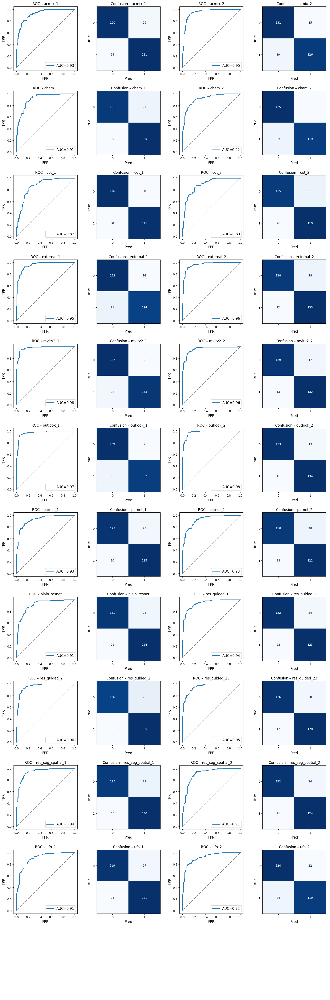

In [82]:
import os, copy, torch, matplotlib.pyplot as plt, pandas as pd
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
import torch.nn as nn

# 1) Your existing factory—some entries are classes, some are instances
model_factory = {
    "res_guided_23": res_global_attention_no_a_23,
    "plain_resnet": ResNetWithAttention(None, None, None, None),  # instance
    "res_guided_1": res_global_attention_no_a_1,
    "res_guided_2": res_global_attention_no_a_2,
    "res_seg_spatial_1":      res_seg_spatial_no_a_1,
    "res_seg_spatial_2":      res_seg_spatial_no_a_2,
    # "res_soft_spatial_no_a":       res_soft_spatial_no_a,
    # "res_soft_spatial_no_a_2":     res_soft_spatial_no_a_2,
    "external_1":  model_external_1,
    "external_2":  model_external_2,
    "outlook_1":   model_outlook_1,
    "outlook_2":   model_outlook_2,
    "cot_1":       model_cot_1,
    "cot_2":       model_cot_2,
    "parnet_1":    model_parnet_1,
    "parnet_2":    model_parnet_2,
    "ufo_1":       model_ufo_1,
    "ufo_2":       model_ufo_2,
    "acmix_1":     model_acmix_1,
    "acmix_2":     model_acmix_2,
    "mvitv2_1":    model_mvitv2_1,
    "mvitv2_2":    model_mvitv2_2,
    "cbam_1":      model_cbam_1,
    "cbam_2":      model_cbam_2
}

base_dir = "runs_resnet_1000"
os.makedirs("plots", exist_ok=True)

# Build list of folders that are both in base_dir and in the factory:
models = [d for d in sorted(os.listdir(base_dir))
          if not d.startswith(".") and d in model_factory]

# Prepare grid
n_cells = len(models)*2 + 2  # +2 for gap after plain_resnet
n_cols  = 4
n_rows  = (n_cells + n_cols - 1)//n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
flat_ax = axes.ravel()
cell = 0

def blank(ax): ax.axis("off")

for model_name in models:
    # 1) find best fold
    best_val, best_fold = -1.0, None
    for f in range(1,6):
        hist = os.path.join(base_dir, model_name, f"fold{f}_history.csv")
        if os.path.exists(hist):
            v = pd.read_csv(hist)["val_acc"].max()
            if v > best_val:
                best_val, best_fold = v, f
    if best_fold is None:
        blank(flat_ax[cell]); blank(flat_ax[cell+1])
        cell += 2
        continue

    ckpt = os.path.join(base_dir, model_name, f"fold{best_fold}_best.pth")
    if not os.path.exists(ckpt):
        blank(flat_ax[cell]); blank(flat_ax[cell+1])
        cell += 2
        continue

    # 2) instantiate / copy model
    proto = model_factory[model_name]
    if isinstance(proto, nn.Module):
        model = copy.deepcopy(proto)
    else:
        model = proto()
    model.load_state_dict(torch.load(ckpt, map_location="cpu"))
    model.eval()

    # 3) inference
    y_t, y_p, y_pb = [], [], []
    with torch.no_grad():
        for img, mask, lbl in test_loader:
            try:
                logits = model(img)
            except:
                logits = model(img,mask)
            prob1  = torch.softmax(logits,1)[:,1]
            pred   = logits.argmax(1)
            y_t.extend(lbl.numpy())
            y_p.extend(pred.numpy())
            y_pb.extend(prob1.numpy())

    if len(set(y_t)) < 2:
        blank(flat_ax[cell]); blank(flat_ax[cell+1])
        cell += 2
        continue

    # 4) ROC subplot
    fpr, tpr, _ = roc_curve(y_t, y_pb)
    roc_auc     = auc(fpr, tpr)
    axr = flat_ax[cell]
    axr.plot(fpr, tpr, lw=2, label=f"AUC={roc_auc:.2f}")
    axr.plot([0,1],[0,1],"--", color="gray")
    axr.set_title(f"ROC – {model_name}", fontsize=12)
    axr.set_xlabel("FPR", fontsize=12); axr.set_ylabel("TPR", fontsize=12)
    axr.set_aspect("equal"); axr.legend(fontsize=12)

    # 5) Confusion matrix subplot
    axc = flat_ax[cell+1]
    cm  = confusion_matrix(y_t, y_p)
    disp = ConfusionMatrixDisplay(cm, display_labels=["0","1"])
    disp.plot(ax=axc, cmap="Blues", colorbar=False, values_format="d")
    axc.set_title(f"Confusion – {model_name}", fontsize=12)
    axc.set_aspect("equal")
    axc.set_xlabel("Pred", fontsize=12); axc.set_ylabel("True", fontsize=12)

    cell += 2

    # # 6) gap after baseline
    # if model_name == "plain_resnet":
    #     blank(flat_ax[cell]); blank(flat_ax[cell+1])
    #     cell += 2

# clear out any extra cells
for i in range(cell, n_rows*n_cols):
    blank(flat_ax[i])

plt.tight_layout(h_pad=2, w_pad=2)
plt.savefig('rocs.pdf', dpi=300, bbox_inches='tight')  # save as PNG
plt.show()


TypeError: forward() takes 2 positional arguments but 3 were given

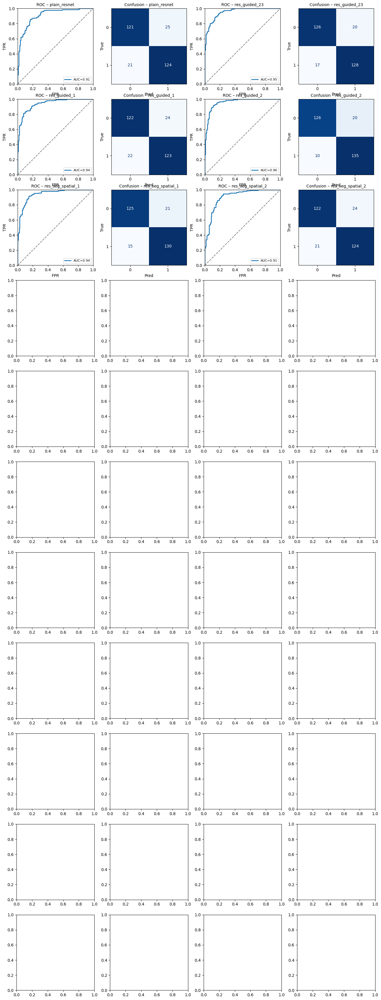

In [36]:
import os, copy, torch, matplotlib.pyplot as plt, pandas as pd
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay

# callable factory (unchanged)
model_factory = {
    "external_1":  lambda: model_external_1, "external_2":  lambda: model_external_2,
    "outlook_1":   lambda: model_outlook_1,  "outlook_2":   lambda: model_outlook_2,
    "cot_1":       lambda: model_cot_1,      "cot_2":       lambda: model_cot_2,
    "parnet_1":    lambda: model_parnet_1,   "parnet_2":    lambda: model_parnet_2,
    "ufo_1":       lambda: model_ufo_1,      "ufo_2":       lambda: model_ufo_2,
    "acmix_1":     lambda: model_acmix_1,    "acmix_2":     lambda: model_acmix_2,
    "mvitv2_1":    lambda: model_mvitv2_1,   "mvitv2_2":    lambda: model_mvitv2_2,
    "cbam_1":      lambda: model_cbam_1,     "cbam_2":      lambda: model_cbam_2,
    "plain_resnet":lambda: ResNetWithAttention(None, None, None, None), "res_guided_23":lambda: res_global_attention_no_a_23,
    "res_guided_1": lambda:res_global_attention_no_a_1,
    "res_guided_2": lambda:res_global_attention_no_a_2,
    "res_seg_spatial_1":  lambda:    res_seg_spatial_no_a_1,
    "res_seg_spatial_2":  lambda:    res_seg_spatial_no_a_2,
}

ordered = [
    "plain_resnet", "res_guided_23",  "res_guided_1", "res_guided_2"       ...            
    "cbam_1", "cbam_2", "acmix_1", "acmix_2",
    "cot_1", "cot_2", "external_1", "external_2",
    "mvitv2_1", "mvitv2_2", "outlook_1", "outlook_2",
    "parnet_1", "parnet_2", "ufo_1", "ufo_2"
]

base_dir = "runs_resnet_1000"
out_pdf  = "plots/all_models_summary.pdf"
os.makedirs("plots", exist_ok=True)

# -------- create 4‑column grid ------------------------------------
pairs   = [[(m, 'ROC'), (m, 'CM')] for m in ordered ] # conceptually 34 items
n_cells = len(ordered) * 2
n_rows  = ((n_cells + 3) // 4)          # ceil division
fig, axes = plt.subplots(n_rows, 4, figsize=(16, 4 * n_rows))

# flatten axes for easy indexing
flat_ax = axes.ravel()

# helper to plot a blank cell
def blank(ax): ax.axis('off')

cell = 0
for model_name in ordered:
    # Find best fold
    best_fold, best_val = '', 0
    for f in [f'fold%d' % i for i in range(1, 6)]:
        h = os.path.join(base_dir, model_name, f"{f}_history.csv")
        if os.path.exists(h):
            acc = pd.read_csv(h)['val_acc'].max()
            if acc > best_val: best_val, best_fold = acc, f
    if not best_fold:   # leave two blanks
        blank(flat_ax[cell]);   blank(flat_ax[cell+1]);   cell += 2;  continue

    ckpt = os.path.join(base_dir, model_name, f"{best_fold}_best.pth")
    if not os.path.exists(ckpt):
        blank(flat_ax[cell]);   blank(flat_ax[cell+1]);   cell += 2;  continue

    # fresh model
    model = model_factory[model_name]()
    model.load_state_dict(torch.load(ckpt, map_location='cpu'))
    model.eval()

    # inference
    y_t, y_p, y_pb = [], [], []
    with torch.no_grad():
        for img, mask, lbl in test_loader:
            try:
                logits = model(img)
            except:
                logits = model(img,mask)
            pb1    = torch.softmax(logits, 1)[:, 1]
            pred   = torch.argmax(logits, 1)
            y_t.extend(lbl.numpy());  y_p.extend(pred.numpy());  y_pb.extend(pb1.numpy())

    if len(set(y_t)) < 2:
        blank(flat_ax[cell]);   blank(flat_ax[cell+1]);   cell += 2;  continue

    # ---- ROC subplot ---------------------------------------------
    fpr, tpr, _ = roc_curve(y_t, y_pb)
    roc_auc     = auc(fpr, tpr)
    ax_roc      = flat_ax[cell]
    ax_roc.plot(fpr, tpr, lw=2, label=f'AUC={roc_auc:.2f}')
    ax_roc.plot([0,1],[0,1],'--',color='gray')
    ax_roc.set_xlim(0,1); ax_roc.set_ylim(0,1)
    ax_roc.set_aspect('equal', adjustable='box')
    ax_roc.set_title(f'ROC – {model_name}', fontsize=10)
    ax_roc.set_xlabel('FPR'); ax_roc.set_ylabel('TPR'); ax_roc.legend(fontsize=8)

    # ---- CM subplot ----------------------------------------------
    cm   = confusion_matrix(y_t, y_p)
    disp = ConfusionMatrixDisplay(cm, display_labels=['0','1'])
    disp.plot(ax=flat_ax[cell+1], cmap='Blues', colorbar=False, values_format='d')
    flat_ax[cell+1].set_title(f'Confusion – {model_name}', fontsize=10)
    flat_ax[cell+1].set_aspect('equal', adjustable='box')
    flat_ax[cell+1].set_xlabel('Pred'); flat_ax[cell+1].set_ylabel('True')

    cell += 2
    # if baseline (plain_resnet), skip two cells so it stays alone
    if model_name == "plain_resnet":
        blank(flat_ax[cell]); blank(flat_ax[cell+1]); cell += 2

# any remaining cells off
for i in range(cell, n_rows * 4):
    blank(flat_ax[i])

plt.tight_layout(h_pad=2, w_pad=2)
# plt.savefig(out_pdf)
# plt.close()
plt.show()
print(f"✅ single‑page grid saved → {out_pdf}")


In [26]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 300

# Settings
backbones   = {
    'ResNet-1000':    'runs_resnet_1000',
    'MobileNet-1000': 'runs_mobile_1000'
}
history_file = 'fold1_history.csv'
window       = 50  # rolling window size

# 1) Load histories
all_histories = {}
for name, d in backbones.items():
    hist = {}
    for m in sorted(os.listdir(d)):
        p = os.path.join(d, m, history_file)
        if os.path.isfile(p):
            hist[m] = pd.read_csv(p)
    all_histories[name] = hist

# 2) Define a function to map each run to one of 12 families
def family_name(run):
    if 'acmix' in run:    return 'acmix'
    if 'cbam' in run:     return 'cbam'
    if 'cot_' in run:     return 'cot'
    if run.startswith('external'): return 'external'
    if 'mnet_global_attention' in run: return 'global_attention'
    if 'mnet_guided' in run or 'res_guided' in run: return 'guided_attention'
    if 'seg_spatial' in run: return 'seg_spatial'
    if 'soft_spatial_no_a' in run: return 'soft_spatial'
    if run.startswith('mvitv'):   return 'mvitv'
    if run.startswith('outlook'): return 'outlook'
    if run.startswith('parnet'):  return 'parnet'
    if 'plain' in run:            return 'plain'
    if 'ufo' in run:              return 'ufo'
    return run  # fallback

# 3) Build the sorted list of families (should be 12)
families = sorted({family_name(r) 
                   for hist in all_histories.values() 
                   for r in hist})

# verify we have 12
assert len(families) == 12, f"Expected 12 families, got {families}"


# 3a) Get 10 colors from 'tab10'
cmap10 = plt.get_cmap('tab10')
colors10 = [cmap10(i) for i in range(10)]

# 3b) Get two extra from 'tab20b'
cmap20b = plt.get_cmap('tab20b')
# pick every third to maximize separation
extras = [cmap20b(i * 3) for i in range(2)]

# 3c) Combine and shuffle
palette = colors10 + extras
random.seed(0)
random.shuffle(palette)

# 4) Map each family to a color
family_colors = dict(zip(families, palette))

# 5) Helper to map runs → their family color
def make_color_map(hist_dict):
    cmap = {}
    for run in hist_dict:
        fam = family_name(run)
        cmap[run] = family_colors[fam]
    return cmap

# 6) Plot functions (same as before)
def plot_val_acc(histories, colors, title, fname):
    plt.figure(figsize=(12,6))
    for run, df in histories.items():
        if run in {
            'mnet_global_attention_no_a',
            'mnet_soft_spatial_no_a',
            'res_soft_spatial_no_a',
            'res_soft_spatial_no_a_2'
        }:
            continue
        ls = ('-'  if run.endswith('_1') and run.startswith('res_guided') else
              ':'  if run.endswith('_2') and run.startswith('res_guided') else
              '--' if run.startswith('res_guided') else
              '--' if run.endswith('_2') else
              '-')
        sm = df['val_acc'].rolling(window, center=True, min_periods=1).mean()
        plt.plot(df['epoch'], sm,
                 label=run,
                 color=colors[run],
                 linestyle=ls,
                 linewidth=1)
    # plt.title(title)
    plt.ylim(0.4,1.0)
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.legend(fontsize='medium', ncol=2)
    plt.tight_layout()
    plt.savefig(fname)
    plt.close()

def plot_train_loss(histories, colors, title, fname):
    plt.figure(figsize=(12,6))
    for run, df in histories.items():
        if run in {
            'mnet_global_attention_no_a',
            'mnet_soft_spatial_no_a',
            'res_soft_spatial_no_a',
            'res_soft_spatial_no_a_2'
        }:
            continue
        ls = ('-'  if run.endswith('_1') and run.startswith('res_guided') else
              ':'  if run.endswith('_2') and run.startswith('res_guided') else
              '--' if run.startswith('res_guided') else
              '--' if run.endswith('_2') else
              '-')
        sm = df['train_loss'].rolling(window, center=True, min_periods=1).mean()
        plt.plot(df['epoch'], sm,
                 label=run,
                 color=colors[run],
                 linestyle=ls,
                 linewidth=1)
    # plt.title(title)
    plt.xlabel('Epoch')
    plt.ylabel('Training Loss')
    plt.legend(fontsize='medium', ncol=2)
    plt.tight_layout()
    plt.savefig(fname)
    plt.close()

# 7) Generate and save all four figures
for backbone, hist in all_histories.items():
    cmap_map = make_color_map(hist)
    plot_val_acc(
        hist, cmap_map,
        f'{backbone} — Validation Accuracy',
        f'{backbone.lower().replace(" ", "_")}_val_acc.pdf'
    )
    plot_train_loss(
        hist, cmap_map,
        f'{backbone} — Training Loss',
        f'{backbone.lower().replace(" ", "_")}_train_loss.pdf'
    )


In [49]:
# %% Grad-CAM without any real cv2 dependency
import sys, types, numpy as np, torch, torch.nn.functional as F, matplotlib.pyplot as plt
from PIL import Image

# ─── 1) FULLLY STUB-OUT cv2 ───────────────────────────────────────────
cv2 = types.ModuleType("cv2")

def _resize(img, size):
    # support float32 [0,1] or uint8 [0,255]
    arr = (img * 255).astype(np.uint8) if img.dtype in (np.float32, np.float64) else img
    pil = Image.fromarray(arr)
    # PIL.resize takes (width, height)
    pil = pil.resize((size[1], size[0]), Image.BILINEAR)
    out = np.array(pil)
    # convert back to float [0,1] if input was float
    return (out.astype(np.float32) / 255.0) if img.dtype in (np.float32, np.float64) else out

def _applyColorMap(img, cmap):
    # img: 2D array (H,W) uint8 or float; produce 3-channel uint8 heatmap
    u8 = img if img.dtype == np.uint8 else np.uint8(img * 255)
    return np.stack([u8, u8, u8], axis=2)

def _cvtColor(img, code):
    # swap BGR→RGB (just reverse the last axis)
    return img[..., ::-1]

cv2.resize         = _resize
cv2.applyColorMap  = _applyColorMap
cv2.cvtColor       = _cvtColor
cv2.COLORMAP_JET   = 0
cv2.COLOR_BGR2RGB  = 4

# inject into sys.modules before grad-cam even loads
sys.modules['cv2'] = cv2

# ─── 2) FORCE FRESH IMPORT OF pytorch_grad_cam ──────────────────────
sys.path.insert(0, "pytorch-grad-cam")  # local clone
sys.path.insert(0, "/mnt/data")                   # where mobilenetv3_seg_global.py lives
for m in list(sys.modules):
    if m.startswith("pytorch_grad_cam"):
        del sys.modules[m]

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

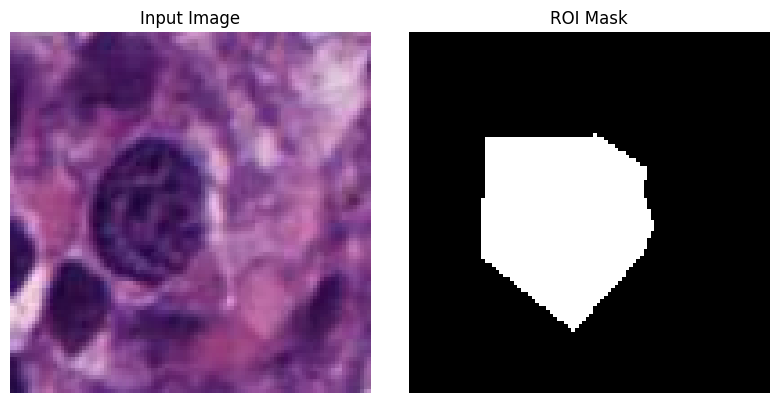

In [68]:
# %% Compact Grad-CAM grid for 4 epochs + save to disk
import os, torch, numpy as np, matplotlib.pyplot as plt
from IPython.display import FileLink

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# your single sample (reuse what you already have)
imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")
img = imgs[0]                              # (3,H,W)
inp = img.unsqueeze(0).to(device)          # (1,3,H,W)
rgb = img.permute(1,2,0).cpu().numpy()
rgb = (rgb - rgb.min())/(rgb.max()-rgb.min())

import matplotlib.pyplot as plt

# assuming `rgb` is your normalized image array of shape (H, W, 3)
# and `masks` is a tensor or array where masks[0] is your binary mask (H, W)

mask = masks[0].cpu().numpy().squeeze()  # convert to numpy if it’s a tensor

plt.figure(figsize=(8, 4))

# left: RGB image
ax = plt.subplot(1, 2, 1)
ax.imshow(rgb)
ax.set_title("Input Image")
ax.axis("off")

# right: mask
ax = plt.subplot(1, 2, 2)
ax.imshow(mask, cmap="gray")
ax.set_title("ROI Mask")
ax.axis("off")

plt.tight_layout(h_pad=2, w_pad=2)
plt.savefig("image_and_mask.pdf", dpi=300, bbox_inches="tight")
plt.show()



Saved grid to attentions_gradcam.pdf


/auto/vestec1-elixir/home/dostama4/attentions_gradcam.pdf

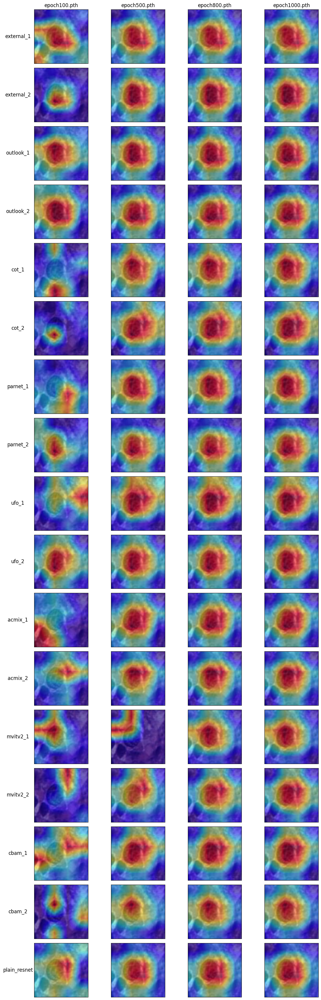

In [65]:
# 3) define your list of (name, model_obj) as before
models_list_all = [
    ("external_1", model_external_1),
    ("external_2", model_external_2),
    ("outlook_1",  model_outlook_1),
    ("outlook_2",  model_outlook_2),
    ("cot_1",      model_cot_1),
    ("cot_2",      model_cot_2),
    ("parnet_1",   model_parnet_1),
    ("parnet_2",   model_parnet_2),
    ("ufo_1",      model_ufo_1),
    ("ufo_2",      model_ufo_2),
    ("acmix_1",    model_acmix_1),
    ("acmix_2",    model_acmix_2),
    ("mvitv2_1",   model_mvitv2_1),
    ("mvitv2_2",   model_mvitv2_2),
    ("cbam_1",     model_cbam_1),
    ("cbam_2",     model_cbam_2),
    ("plain_resnet", ResNetWithAttention(None,None,None,None)),
]
# %% Compact Grad-CAM grid for 4 epochs + save to disk
import os, torch, numpy as np, matplotlib.pyplot as plt
from IPython.display import FileLink

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# your single sample (reuse what you already have)
imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")
img = imgs[0]                              # (3,H,W)
inp = img.unsqueeze(0).to(device)          # (1,3,H,W)
rgb = img.permute(1,2,0).cpu().numpy()
rgb = (rgb - rgb.min())/(rgb.max()-rgb.min())

# which checkpoints to include, in order
epochs = ["fold1_epoch100.pth",
          "fold1_epoch500.pth",
          "fold1_epoch800.pth",
          "fold1_epoch1000.pth"]

# prepare the result grid: rows=models, cols=epochs
n_models = len(models_list_all)
n_eps    = len(epochs)
fig, axes = plt.subplots(n_models, n_eps, figsize=(3*n_eps, 2*n_models), squeeze=False)

for i, (name, model_obj) in enumerate(models_list_all):
    ckpt_dir = os.path.join("runs_resnet_1000", name)
    for j, ep in enumerate(epochs):
        path = os.path.join(ckpt_dir, ep)
        if not os.path.isfile(path):
            # blank if missing
            axes[i][j].axis("off")
            continue

        # load model + weights
        model = model_obj.to(device).eval()
        model.load_state_dict(torch.load(path, map_location=device))

        target_layer = model.layer4[-1].conv2
        cam = GradCAM(model=model, target_layers=[target_layer])
        gray = cam(input_tensor=inp)[0]  # (H,W)

        # alpha‐blend jet(gray) onto rgb
        jetmap  = plt.get_cmap("jet")(gray)[...,:3]
        overlay = rgb*(1-0.5) + jetmap*0.5

        # plot
        ax = axes[i][j]
        ax.imshow(overlay, aspect="equal")
        ax.set_xticks([]); ax.set_yticks([])
        if i == 0:
            ax.set_title(ep.replace("fold1_",""), fontsize=12)
    # label rows
    axes[i][0].set_ylabel(name, rotation=0, labelpad=40, va="center", fontsize=12)

plt.tight_layout()

# save to file
out_path = "attentions_gradcam.pdf"
fig.savefig(out_path, dpi=600, bbox_inches="tight")
print(f"Saved grid to {out_path}")

# provide download link
display(FileLink(out_path))


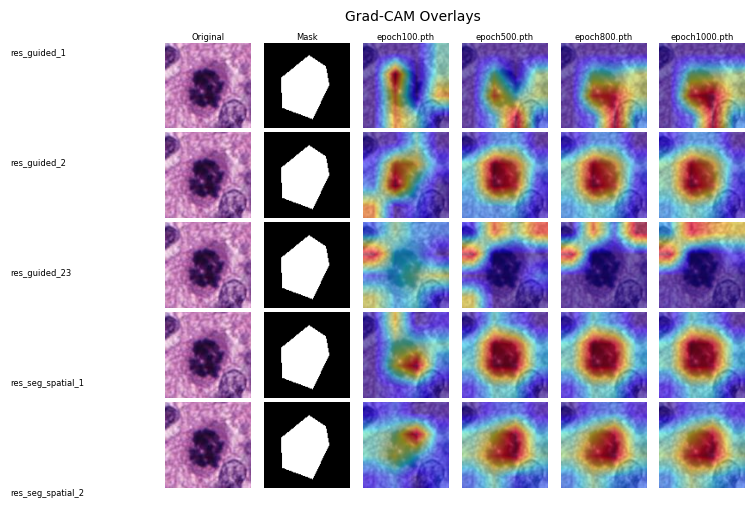

Saved → gradcam_compact_named.png


/auto/vestec1-elixir/home/dostama4/gradcam_compact_named.png

In [35]:
# %% Compact Grad-CAM grid with explicit row‐labels

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

our_models = [
    ("res_guided_1",   res_global_attention_no_a_1,   True),
    ("res_guided_2",   res_global_attention_no_a_2,   True),
    ("res_guided_23",  res_global_attention_no_a_23,  True),
    ("res_seg_spatial_1",        res_seg_spatial_no_a_1,        True),
    ("res_seg_spatial_2",        res_seg_spatial_no_a_2,        True),
]

epochs = ["fold1_epoch100.pth", "fold1_epoch500.pth", "fold1_epoch800.pth", "fold1_epoch1000.pth"]

# load one (img,mask) example
imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")
n = 5
img, msk, _ = imgs[n], masks[n], labels[n]
msk2 = msk.squeeze(0).numpy()
msk3 = torch.from_numpy(msk2).unsqueeze(0).repeat(3,1,1)
x6  = torch.cat([img, msk3], dim=0).unsqueeze(0).to(device)
rgb = img.permute(1,2,0).numpy()
rgb = (rgb - rgb.min())/(rgb.max()-rgb.min())

class ImgMaskWrapper(nn.Module):
    def __init__(self, model):
        super().__init__(); self.model = model
    def forward(self, x6):
        return self.model(x6[:,:3], x6[:,3:])

# grid dims
n_models = len(our_models)
n_cols   = 2 + len(epochs)
fig, axes = plt.subplots(n_models, n_cols,
                         figsize=(1.4*n_cols, 1.1*n_models),
                         squeeze=False)

plt.subplots_adjust(left=0.2, top=0.92, wspace=0.05, hspace=0.05)
fig.suptitle("Grad-CAM Overlays", fontsize=10)

# column headers
cols = ["Original", "Mask"] + [e.replace("fold1_","") for e in epochs]
for j, title in enumerate(cols):
    axes[0][j].set_title(title, fontsize=6, pad=2)

# iterate
for i, (name, base_model, needs_mask) in enumerate(our_models):
    # draw name manually
    fig.text(0.02, 1 - (i + 0.5)/n_models, name,
             va="center", ha="left", fontsize=6)
    
    # original
    ax = axes[i][0]
    ax.imshow(rgb); ax.axis("off")
    # mask
    ax = axes[i][1]
    ax.imshow(msk2, cmap="gray"); ax.axis("off")
    
    # each epoch
    for j, ep in enumerate(epochs, start=2):
        ckpt = os.path.join("runs_resnet_1000", name, ep)
        ax = axes[i][j]
        if not os.path.isfile(ckpt):
            ax.axis("off")
            continue

        # load & wrap
        model = base_model.to(device).eval()
        model.load_state_dict(torch.load(ckpt, map_location=device))
        if needs_mask:
            model_in = ImgMaskWrapper(model).to(device).eval()
            inp = x6
        else:
            model_in = model
            inp = img.unsqueeze(0).to(device)

        # last conv of layer4
        target = model.layer4[-1].conv2
        cam    = GradCAM(model=model_in, target_layers=[target])
        gray   = cam(input_tensor=inp)[0]

        # overlay
        jet    = plt.get_cmap("jet")(gray)[...,:3]
        over   = rgb*(1-0.5) + jet*0.5
        ax.imshow(over); ax.axis("off")

plt.show()

# # save + download link
out = "gradcam_compact_named.png"
fig.savefig(out, dpi=500, bbox_inches="tight")
from IPython.display import FileLink
print(f"Saved → {out}")
display(FileLink(out))


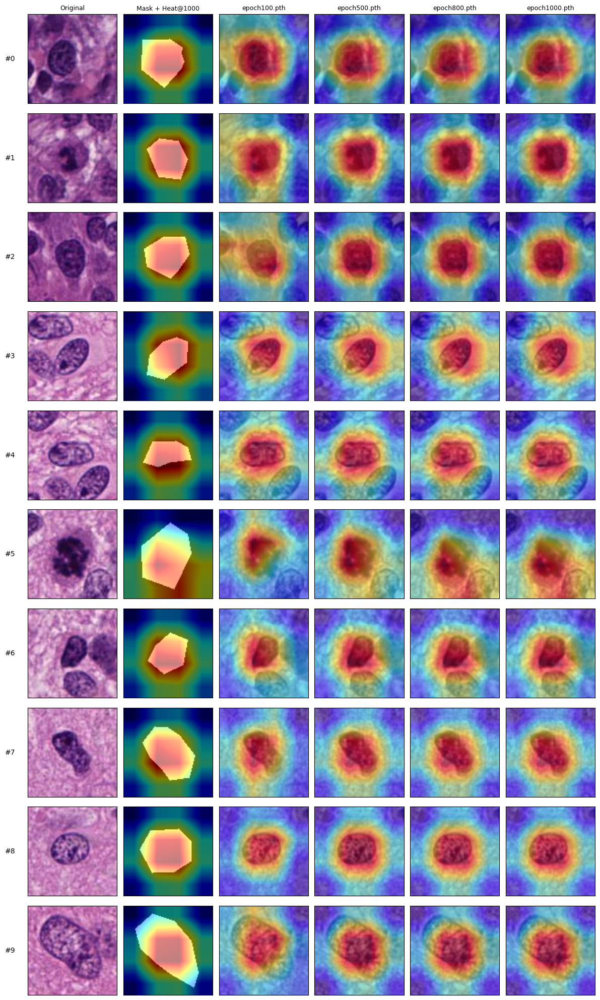

In [31]:
# ──────────────────────────────────────────────────────────────────────────────
# CELL: Original • Mask BG + Heat@1000 • Grad-CAM grid for outlook_2 over first 10 samples
# ──────────────────────────────────────────────────────────────────────────────
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM
from torchvision import transforms

# ─── Setup ────────────────────────────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")

# Precompute normalized RGBs and masks
rgbs, msks = [], []
for idx in range(10):
    img = imgs[idx]
    rgb = img.permute(1,2,0).numpy()
    rgb = (rgb - rgb.min())/(rgb.max()-rgb.min())
    rgbs.append(rgb)
    msks.append(masks[idx].squeeze(0).numpy())

# Load 1000-epoch model once
ckpt_1000 = os.path.join("runs_resnet_1000", "outlook_2", "fold1_epoch1000.pth")
model_1000 = model_outlook_2.to(device).eval()
model_1000.load_state_dict(torch.load(ckpt_1000, map_location=device))
target_layer = model_1000.layer4[-1].conv2
cam1000 = GradCAM(model=model_1000, target_layers=[target_layer])

# ─── Build grid ────────────────────────────────────────────────────────────────
epochs = [
    "fold1_epoch100.pth",
    "fold1_epoch500.pth",
    "fold1_epoch800.pth",
    "fold1_epoch1000.pth"
]
n_samples = 10
n_epochs  = len(epochs)
ncols     = 2 + n_epochs
fig, axes = plt.subplots(n_samples, ncols,
                         figsize=(2*ncols, 2*n_samples),
                         squeeze=False)

for i in range(n_samples):
    inp = imgs[i].unsqueeze(0).to(device)
    rgb = rgbs[i]
    msk = msks[i]

    # Col 0: original
    ax = axes[i][0]
    ax.imshow(rgb)
    ax.set_xticks([]); ax.set_yticks([])
    if i == 0:
        ax.set_title("Original", fontsize=9)

    # Col 1: mask bg + heatmap overlay
    # 1) gray background from mask
    mask_bg = np.stack([msk,msk,msk], axis=2)  # 3-channel gray
    # 2) compute heatmap
    gray1000 = cam1000(input_tensor=inp)[0]
    jet1000  = plt.get_cmap("jet")(gray1000)[...,:3]
    # 3) overlay
    overlay = mask_bg * 0.5 + jet1000 * 0.5
    ax = axes[i][1]
    ax.imshow(overlay)
    ax.set_xticks([]); ax.set_yticks([])
    if i == 0:
        ax.set_title("Mask + Heat@1000", fontsize=9)

    # Cols 2+: full Grad-CAM overlays
    for j, ep in enumerate(epochs):
        ax = axes[i][2 + j]
        ckpt = os.path.join("runs_resnet_1000", "outlook_2", ep)
        if not os.path.isfile(ckpt):
            ax.axis("off")
            continue

        # load & eval that epoch
        model = model_outlook_2.to(device).eval()
        model.load_state_dict(torch.load(ckpt, map_location=device))
        cam   = GradCAM(model=model, target_layers=[target_layer])
        gray  = cam(input_tensor=inp)[0]
        jet   = plt.get_cmap("jet")(gray)[...,:3]
        ov    = rgb * 0.5 + jet * 0.5

        ax.imshow(ov, aspect="equal")
        ax.set_xticks([]); ax.set_yticks([])
        if i == 0:
            ax.set_title(ep.replace("fold1_",""), fontsize=9)

    # label row
    axes[i][0].set_ylabel(f"#{i}", rotation=0,
                          labelpad=25, va="center")

plt.tight_layout()
plt.show()


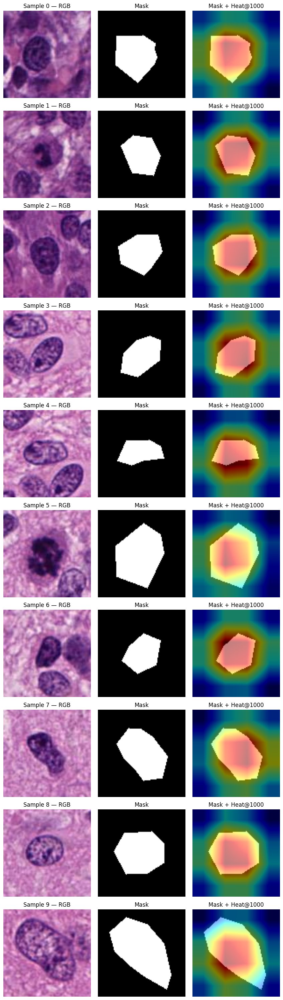

In [40]:
# %% Iterate res_global_attention_no_a_2 over first 10 samples
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn
from pytorch_grad_cam import GradCAM
from torchvision import transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1) load your trained model for fold1 epoch1000
ckpt = "runs_resnet_1000/res_guided_2/fold1_epoch1000.pth"
model = res_global_attention_no_a_2.to(device).eval()
model.load_state_dict(torch.load(ckpt, map_location=device))

# wrapper so GradCAM can call it with (img,mask)
class ImgMaskWrapper(nn.Module):
    def __init__(self, m): super().__init__(); self.m = m
    def forward(self, x6):
        return self.m(x6[:,:3], x6[:,3:])

wrapped = ImgMaskWrapper(model).to(device).eval()

# target layer
target = model.layer4[-1].conv2

# 2) load samples
imgs, masks, _ = torch.load("saved_datasets/train/train.pt", map_location="cpu")
transform_norm = transforms.Normalize(mean=[0,0,0], std=[1,1,1])  # assume already normalized

# we'll display first 10 examples
n = 10
fig, axes = plt.subplots(n, 3, figsize=(9, 3*n), squeeze=False)
plt.subplots_adjust(hspace=0.4)

for i in range(n):
    img = imgs[i]                     # (3,H,W)
    msk = masks[i].squeeze(0).numpy() # (H,W)
    # prepare input tensor (img + mask channels)
    msk3 = torch.from_numpy(msk).unsqueeze(0).repeat(3,1,1)
    x6   = torch.cat([img, msk3], dim=0).unsqueeze(0).to(device)

    # Original RGB
    rgb = img.permute(1,2,0).numpy()
    rgb = (rgb - rgb.min())/(rgb.max()-rgb.min())
    ax = axes[i][0]
    ax.imshow(rgb); ax.set_title(f"Sample {i} — RGB"); ax.axis("off")

    # Mask alone
    ax = axes[i][1]
    ax.imshow(msk, cmap="gray"); ax.set_title("Mask"); ax.axis("off")

    # Grad-CAM over mask
    cam = GradCAM(model=wrapped, target_layers=[target])
    gray = cam(input_tensor=x6)[0]  # (H,W)
    jet  = plt.get_cmap("jet")(gray)[...,:3]
    # use mask as BW background
    bg   = np.stack([msk,msk,msk],axis=2)
    overlay = bg*0.5 + jet*0.5

    ax = axes[i][2]
    ax.imshow(overlay); ax.set_title("Mask + Heat@1000"); ax.axis("off")

plt.tight_layout()
plt.show()


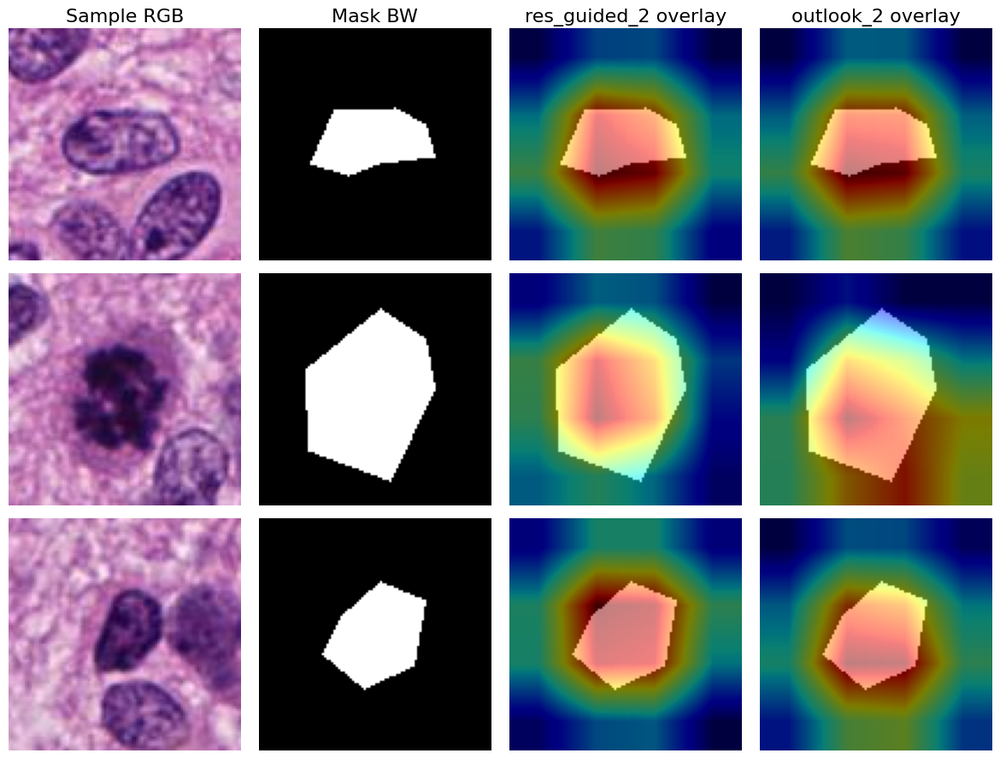

In [50]:
# %% Compare res_guided_2 vs outlook_2 over first 10 samples
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn
from pytorch_grad_cam import GradCAM
from torchvision import transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1) Load both models at fold1_epoch1000
ckpt_rg = "runs_resnet_1000/res_guided_2/fold1_epoch1000.pth"
ckpt_ol = "runs_resnet_1000/outlook_2/fold1_epoch1000.pth"

model_rg = res_global_attention_no_a_2.to(device).eval()
model_rg.load_state_dict(torch.load(ckpt_rg, map_location=device))

model_ol = model_outlook_2.to(device).eval()
model_ol.load_state_dict(torch.load(ckpt_ol, map_location=device))

# 2) Wrap RG so it accepts (img,mask) concatenated
class ImgMaskWrapper(nn.Module):
    def __init__(self, m): super().__init__(); self.m = m
    def forward(self, x6):
        return self.m(x6[:,:3], x6[:,3:])

wrapped_rg = ImgMaskWrapper(model_rg).to(device).eval()
wrapped_ol = model_ol  # outlook takes only img

# 3) Choose the same target layer for both (last conv of layer4)
target_rg = model_rg.layer4[-1].conv2
target_ol = model_ol.layer4[-1].conv2

# 4) Load first 10 samples
imgs, masks, _ = torch.load("saved_datasets/train/train.pt", map_location="cpu")
n_samples = 3

# 5) Prepare figure: rows = samples, cols = 4
cols = ["Sample RGB", "Mask BW", "res_guided_2 overlay", "outlook_2 overlay"]
fig, axes = plt.subplots(n_samples, 4, figsize=(12, 3*n_samples), squeeze=False)
plt.subplots_adjust(hspace=0.4, left=0.15)

# Column titles
for j, title in enumerate(cols):
    axes[0][j].set_title(title, fontsize=10)

for i in range(n_samples):
    img = imgs[i+4]  # (3,H,W)
    msk = masks[i+4].squeeze(0).numpy()  # (H,W)

    # normalize RGB for display
    rgb = img.permute(1,2,0).numpy()
    rgb = (rgb - rgb.min())/(rgb.max()-rgb.min())

    # concat img+mask for wrapped_rg
    msk3 = torch.from_numpy(msk).unsqueeze(0).repeat(3,1,1)
    x6   = torch.cat([img, msk3], dim=0).unsqueeze(0).to(device)

    # --- Col 0: Sample RGB ---
    ax = axes[i][0]
    ax.imshow(rgb); ax.axis("off")
    # row label on left
    ax.set_ylabel(f"#{i}", rotation=0, labelpad=30, va="center", fontsize=9)

    # --- Col 1: Mask BW ---
    ax = axes[i][1]
    ax.imshow(msk, cmap="gray"); ax.axis("off")

    # --- Col 2: RG heatmap over mask ---
    cam_rg = GradCAM(model=wrapped_rg, target_layers=[target_rg])
    gray_rg = cam_rg(input_tensor=x6)[0]
    jet_rg  = plt.get_cmap("jet")(gray_rg)[...,:3]
    bg      = np.stack([msk,msk,msk], axis=2)
    over_rg = bg*0.5 + jet_rg*0.5
    ax = axes[i][2]
    ax.imshow(over_rg); ax.axis("off")

    # --- Col 3: Outlook heatmap over mask ---
    inp_ol = img.unsqueeze(0).to(device)
    cam_ol = GradCAM(model=wrapped_ol, target_layers=[target_ol])
    gray_ol = cam_ol(input_tensor=inp_ol)[0]
    jet_ol  = plt.get_cmap("jet")(gray_ol)[...,:3]
    over_ol = bg*0.5 + jet_ol*0.5
    ax = axes[i][3]
    ax.imshow(over_ol); ax.axis("off")

for ax, title in zip(axes[0], cols):
    ax.set_title(title, fontsize=16)

plt.tight_layout()
plt.savefig('heatmap_overlay.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [94]:
# paper 2:OMG NET: https://www.nature.com/articles/s42003-024-07398-6 
import os, copy, random
import numpy as np, pandas as pd, torch
from torch import nn, optim
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import classification_report, confusion_matrix
from easydict import EasyDict as edict
from OMG.Models.SAM_Classifier import Classifier

# ─── HYPERS & DEVICE ──────────────────────────────────────────────────────
SEED       = 42
LR         = 1e-6
BATCH_SIZE = 32
EPOCHS     = 200
FOLDS      = 5
OUT_DIR    = "runs_omg_200"
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
os.makedirs(OUT_DIR, exist_ok=True)

# ─── HOLD-OUT SPLIT ───────────────────────────────────────────────────────
N = len(full_ds)
labels_arr   = full_ds.tensors[2].numpy()    # (N,)
indices      = np.arange(N)
trainval_idx, test_idx = train_test_split(indices,
                                          test_size=0.1,
                                          random_state=SEED,
                                          stratify=labels_arr)
test_loader = DataLoader(Subset(full_ds, test_idx),
                         batch_size=BATCH_SIZE, shuffle=False)

# ─── CONFIG & PROTOTYPE ───────────────────────────────────────────────────
config = edict({
    "BASEMODEL": {"Loss_Function":"CrossEntropyLoss",
                  "Activation":"Identity",
                  "Backbone":"resnet18",
                  "Mask_Input":True,
                  "Input_Type":"4_Channel"},
    "DATA": {"weights":[1.0,1.0],"Num_of_Classes":2},
    "REGULARIZATION": {"Label_Smoothing":0.0},
    "model": {"name":"resnet18","num_classes":2,"pretrained":False}
})
prototype = Classifier(config)

# ─── K-FOLD TRAIN/VAL & HISTORIES ─────────────────────────────────────────
kf = KFold(n_splits=FOLDS, shuffle=True, random_state=SEED)
best_model_path = None

for fold, (tr_f, va_f) in enumerate(kf.split(trainval_idx), start=1):
    tr_idx = trainval_idx[tr_f]
    va_idx = trainval_idx[va_f]
    print(f"\n=== Fold {fold}/{FOLDS}: train={len(tr_idx)} val={len(va_idx)} test={len(test_idx)}")

    tr_loader = DataLoader(Subset(full_ds, tr_idx),
                           batch_size=BATCH_SIZE, shuffle=True)
    va_loader = DataLoader(Subset(full_ds, va_idx),
                           batch_size=len(va_idx), shuffle=False)

    model     = copy.deepcopy(prototype).to(DEVICE)
    weight    = torch.tensor(config.DATA.weights,
                             dtype=torch.float32, device=DEVICE)
    criterion = nn.CrossEntropyLoss(weight=weight,
                                    label_smoothing=config.REGULARIZATION.Label_Smoothing)
    optimizer = optim.Adam(model.parameters(), lr=LR)

    best_val     = 0.0
    fold_history = []

    for ep in range(1, EPOCHS+1):
        # ─── TRAIN ─────────────────────────
        model.train()
        run_loss = run_corr = run_n = 0
        for imgs_b, masks_b, lbls_b in tr_loader:
            imgs_b, masks_b, lbls_b = (
                imgs_b.to(DEVICE),
                masks_b.to(DEVICE),
                lbls_b.to(DEVICE)
            )
            # extract single‐channel mask from the 3 identical channels
            m1 = masks_b[:, :1, :, :]

            logits = model({"img": imgs_b, "msk": m1})
            loss   = criterion(logits, lbls_b)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            bs = imgs_b.size(0)
            run_loss += loss.item() * bs
            run_corr += (logits.argmax(1)==lbls_b).sum().item()
            run_n   += bs

        train_loss = run_loss / run_n
        train_acc  = run_corr  / run_n

        # ─── VALIDATE ───────────────────────
        model.eval()
        corr = tot = 0
        with torch.no_grad():
            for imgs_b, masks_b, lbls_b in va_loader:
                imgs_b, masks_b, lbls_b = (
                    imgs_b.to(DEVICE),
                    masks_b.to(DEVICE),
                    lbls_b.to(DEVICE)
                )
                m1 = masks_b[:, :1, :, :]
                preds = model({"img": imgs_b, "msk": m1}).argmax(1)
                corr += (preds == lbls_b).sum().item()
                tot  += imgs_b.size(0)
        val_acc = corr / tot

        # ─── LOG & SAVE BEST ─────────────────
        fold_history.append({
            "epoch":      ep,
            "train_loss": train_loss,
            "train_acc":  train_acc,
            "val_acc":    val_acc
        })
        print(f"Fold{fold:02d} Ep{ep:03d} – "
              f"tr_loss={train_loss:.4f}, tr_acc={train_acc:.4f}, val_acc={val_acc:.4f}",
              end="\r")

        if val_acc > best_val:
            best_val        = val_acc
            best_model_path = os.path.join(OUT_DIR, f"fold{fold}_best.pth")
            torch.save(model.state_dict(), best_model_path)

    print(f"\n→ Fold{fold} best-val_acc={best_val:.4f}")

    # ─── dump history to CSV ─────────────────────────────────────────────
    hist_df  = pd.DataFrame(fold_history)
    hist_path= os.path.join(OUT_DIR, f"fold{fold}_history.csv")
    hist_df.to_csv(hist_path, index=False)
    print(f"→ Fold{fold} history saved to {hist_path}")

# ─── FINAL HOLD-OUT EVALUATION ───────────────────────────────────────────
print(f"\nLoading best model from {best_model_path}")
final_model = Classifier(config).to(DEVICE)
final_model.load_state_dict(torch.load(best_model_path))
final_model.eval()

all_preds, all_labels = [], []
total_loss = 0.0
with torch.no_grad():
    for imgs_b, masks_b, lbls_b in test_loader:
        imgs_b, masks_b, lbls_b = (
            imgs_b.to(DEVICE),
            masks_b.to(DEVICE),
            lbls_b.to(DEVICE)
        )
        m1    = masks_b[:, :1, :, :]
        logits= final_model({"img": imgs_b, "msk": m1})
        loss  = criterion(logits, lbls_b)
        total_loss += loss.item() * imgs_b.size(0)
        all_preds .extend(logits.argmax(1).cpu().tolist())
        all_labels.extend(lbls_b.cpu().tolist())

avg_loss = total_loss / len(test_idx)
print(f"\nTest Loss: {avg_loss:.4f}")
print("Classification Report:\n",
      classification_report(all_labels, all_preds,
                            target_names=['Class 0','Class 1']))
print("Confusion Matrix:\n",
      confusion_matrix(all_labels, all_preds))



=== Fold 1/5: train=2093 val=524 test=291
Fold01 Ep200 – tr_loss=0.0017, tr_acc=0.9995, val_acc=0.9408
→ Fold1 best-val_acc=0.9447
→ Fold1 history saved to omg_200/fold1_history.csv

=== Fold 2/5: train=2093 val=524 test=291
Fold02 Ep200 – tr_loss=0.0015, tr_acc=1.0000, val_acc=0.9256
→ Fold2 best-val_acc=0.9370
→ Fold2 history saved to omg_200/fold2_history.csv

=== Fold 3/5: train=2094 val=523 test=291
Fold03 Ep200 – tr_loss=0.0013, tr_acc=1.0000, val_acc=0.9312
→ Fold3 best-val_acc=0.9388
→ Fold3 history saved to omg_200/fold3_history.csv

=== Fold 4/5: train=2094 val=523 test=291
Fold04 Ep200 – tr_loss=0.0012, tr_acc=1.0000, val_acc=0.9293
→ Fold4 best-val_acc=0.9369
→ Fold4 history saved to omg_200/fold4_history.csv

=== Fold 5/5: train=2094 val=523 test=291
Fold05 Ep200 – tr_loss=0.0010, tr_acc=1.0000, val_acc=0.9541
→ Fold5 best-val_acc=0.9598
→ Fold5 history saved to omg_200/fold5_history.csv

Loading best model from omg_200/fold5_best.pth

Test Loss: 0.2084
Classification Rep

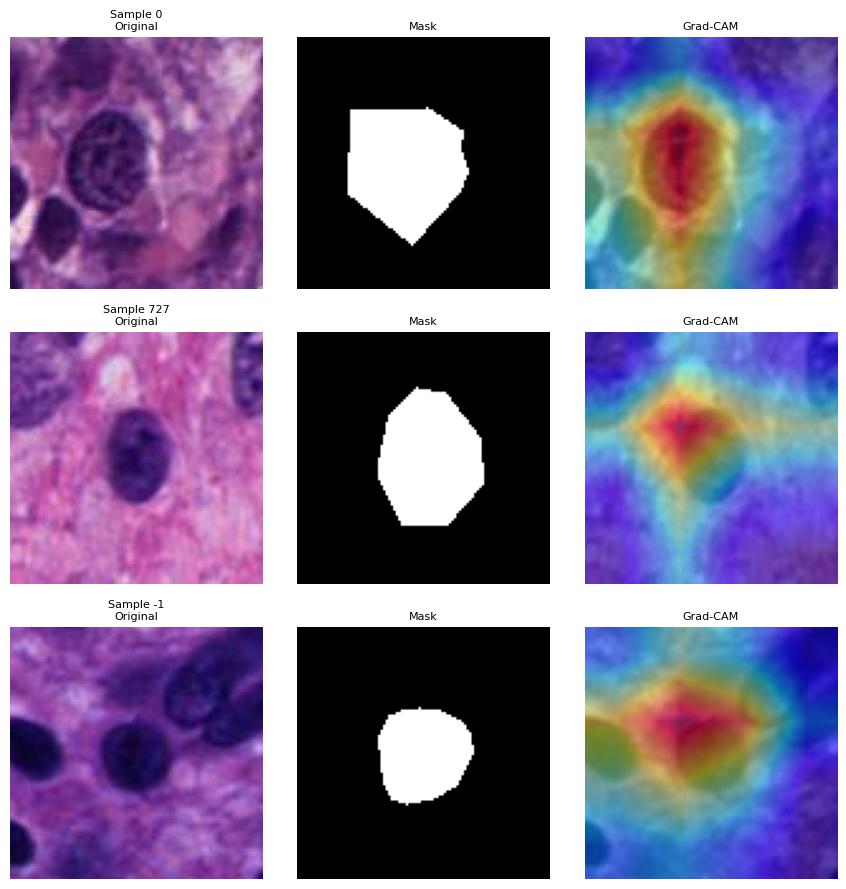

In [8]:
# %% Grad-CAM on one fold, three different samples
import os
import copy
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn
from torchvision import transforms
import torchvision.transforms.functional as TF
from pytorch_grad_cam import GradCAM
from OMG.Models.SAM_Classifier import Classifier

# 1) stub out cv2 so GradCAM works without OpenCV
import types, sys
cv2 = types.ModuleType("cv2")
def _resize(img, size):
    arr = (img*255).astype(np.uint8) if img.dtype in (np.float32, np.float64) else img
    pil = transforms.ToPILImage()(arr).resize((size[1], size[0]), resample=transforms.InterpolationMode.BILINEAR)
    out = np.array(pil)
    return (out.astype(np.float32)/255.0) if img.dtype in (np.float32, np.float64) else out
cv2.resize        = _resize
cv2.applyColorMap = lambda img, cmap: np.stack([img, img, img], axis=2)
cv2.cvtColor      = lambda img, code: img[..., ::-1]
cv2.COLORMAP_JET  = 2
cv2.COLOR_BGR2RGB = 4
sys.modules['cv2'] = cv2

# 2) Configuration & prototype
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
config = {
    "BASEMODEL": {"Loss_Function":"CrossEntropyLoss","Activation":"Identity",
                  "Backbone":"resnet18","Mask_Input":True,"Input_Type":"4_Channel"},
    "DATA": {"weights":[1.0,1.0],"Num_of_Classes":2},
    "REGULARIZATION": {"Label_Smoothing":0.0},
    "model": {"name":"resnet18","num_classes":2,"pretrained":False}
}
prototype = Classifier(config).to(device).eval()

# 3) load one fold checkpoint
fold = 1
ckpt_path = os.path.join("runs_omg_200", f"fold{fold}_best.pth")
assert os.path.isfile(ckpt_path), f"Checkpoint not found: {ckpt_path}"
prototype.load_state_dict(torch.load(ckpt_path, map_location=device))

# 4) wrapper for 4-channel input
class ImgMaskWrapper(nn.Module):
    def __init__(self, cls): super().__init__(); self.cls = cls
    def forward(self, x):
        return self.cls({"img": x[:, :3], "msk": x[:, 3:]})

wrapped = ImgMaskWrapper(prototype).to(device).eval()

# 5) pick three sample indices and load data
imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")
sample_idxs = [0, len(imgs)//2, -1]  # e.g. first, middle, last
n = len(sample_idxs)

# 6) plot grid: n rows × 3 cols (Original | Mask | Grad-CAM)
fig, axes = plt.subplots(n, 3, figsize=(9, 3*n))
plt.subplots_adjust(hspace=0.4, wspace=0.2)

for i, idx in enumerate(sample_idxs):
    img = imgs[idx]
    msk = masks[idx]
    # prepare inputs
    m1  = msk.unsqueeze(0).to(device)                          # (1,1,H,W)
    x4  = torch.cat([img.unsqueeze(0).to(device), m1], dim=1)  # (1,4,H,W)
    rgb = img.permute(1,2,0).numpy()
    rgb = (rgb - rgb.min())/(rgb.max()-rgb.min())

    # Original
    ax0 = axes[i, 0]
    ax0.imshow(rgb)
    ax0.set_title(f"Sample {idx}\nOriginal", fontsize=8)
    ax0.axis("off")

    # Mask
    ax1 = axes[i, 1]
    ax1.imshow(msk.squeeze(0), cmap="gray")
    ax1.set_title("Mask", fontsize=8)
    ax1.axis("off")

    # Grad-CAM
    # hook the very last conv of resnet layer4
    target_layer = prototype.backbone.layer4[-1].conv2
    cam = GradCAM(model=wrapped, target_layers=[target_layer])
    gray = cam(input_tensor=x4)[0]  # (H,W) in [0,1]
    jet  = plt.get_cmap("jet")(gray)[...,:3]
    over = rgb*(1-0.5) + jet*0.5

    ax2 = axes[i, 2]
    ax2.imshow(over)
    ax2.set_title("Grad-CAM", fontsize=8)
    ax2.axis("off")

plt.tight_layout()
plt.show()


In [12]:
import os
import copy
import random
import csv
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import TensorDataset, DataLoader, Subset
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import classification_report, confusion_matrix
from torchvision import transforms
import torchvision.transforms.functional as TF


# paper 1 : https://www.nature.com/articles/s41598-021-85652-1?fromPaywallRec=false
class MitosResCNN(nn.Module):
    def __init__(self):
        super(MitosResCNN, self).__init__()

        # Input layer
        self.input_conv = nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1)
        self.input_bn = nn.BatchNorm2d(32)

        # Block 1
        self.b1_conv1x1 = nn.Conv2d(32, 64, kernel_size=1, stride=1, padding=1)
        self.b1_bn1x1 = nn.BatchNorm2d(64)

        self.b1_conv1 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.b1_bn1 = nn.BatchNorm2d(64)
        self.b1_conv2 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.b1_bn2 = nn.BatchNorm2d(64)
        self.b1_conv3 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.b1_bn3 = nn.BatchNorm2d(64)

        self.b1_pool = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
        self.b1_final_conv = nn.Conv2d(64, 96, kernel_size=1, stride=1, padding=0)
        self.b1_final_bn = nn.BatchNorm2d(96)

        self.b1_skip_conv = nn.Conv2d(32, 96, kernel_size=1, stride=2, padding=0)
        self.b1_skip_bn = nn.BatchNorm2d(96)

        # Block 2
        self.b2_conv1 = nn.Conv2d(96, 96, kernel_size=3, stride=1, padding=1)
        self.b2_bn1 = nn.BatchNorm2d(96)
        self.b2_conv2 = nn.Conv2d(96, 96, kernel_size=3, stride=1, padding=1)
        self.b2_bn2 = nn.BatchNorm2d(96)
        self.b2_conv3 = nn.Conv2d(96, 96, kernel_size=3, stride=1, padding=1)
        self.b2_bn3 = nn.BatchNorm2d(96)

        self.b2_pool = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
        self.b2_final_conv = nn.Conv2d(96, 288, kernel_size=1, stride=1, padding=0)
        self.b2_final_bn = nn.BatchNorm2d(288)

        self.b2_skip_conv = nn.Conv2d(96, 288, kernel_size=1, stride=2, padding=0)
        self.b2_skip_bn = nn.BatchNorm2d(288)

        # Block 3
        self.b3_conv1 = nn.Conv2d(288, 288, kernel_size=3, stride=1, padding=1)
        self.b3_bn1 = nn.BatchNorm2d(288)
        self.b3_conv2 = nn.Conv2d(288, 288, kernel_size=3, stride=1, padding=1)
        self.b3_bn2 = nn.BatchNorm2d(288)
        self.b3_conv3 = nn.Conv2d(288, 288, kernel_size=3, stride=1, padding=1)
        self.b3_bn3 = nn.BatchNorm2d(288)

        self.b3_pool = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
        self.b3_final_conv = nn.Conv2d(288, 512, kernel_size=3, stride=1, padding=1)
        self.b3_final_bn = nn.BatchNorm2d(512)

        self.b3_skip_conv = nn.Conv2d(288, 512, kernel_size=1, stride=2, padding=0)
        self.b3_skip_bn = nn.BatchNorm2d(512)

        # Final layers
        self.global_pool = nn.AdaptiveAvgPool2d((4, 4))
        self.dropout1 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(512 * 4 * 4, 150)
        self.dropout2 = nn.Dropout(0.5)
        self.bn1d = nn.BatchNorm1d(150)
        self.fc2 = nn.Linear(150, 2)

    def forward(self, x):
        # Input layer
        x = F.leaky_relu(self.input_bn(self.input_conv(x)), 0.1)

        # Block 1
        out = F.leaky_relu(self.b1_bn1x1(self.b1_conv1x1(x)), 0.1)
        out = F.leaky_relu(self.b1_bn1(self.b1_conv1(out)), 0.1)
        out = F.leaky_relu(self.b1_bn2(self.b1_conv2(out)), 0.1)
        out = F.leaky_relu(self.b1_bn3(self.b1_conv3(out)), 0.1)
        out = self.b1_pool(out)
        out = F.leaky_relu(self.b1_final_bn(self.b1_final_conv(out)), 0.1)

        skip = self.b1_skip_bn(self.b1_skip_conv(x))
        if out.shape != skip.shape:
            skip = F.interpolate(skip, size=out.shape[2:], mode="bilinear", align_corners=False)
        x = F.leaky_relu(out + skip, 0.1)

        # Block 2
        out = F.leaky_relu(self.b2_bn1(self.b2_conv1(x)), 0.1)
        out = F.leaky_relu(self.b2_bn2(self.b2_conv2(out)), 0.1)
        out = F.leaky_relu(self.b2_bn3(self.b2_conv3(out)), 0.1)
        out = self.b2_pool(out)
        out = F.leaky_relu(self.b2_final_bn(self.b2_final_conv(out)), 0.1)

        skip = self.b2_skip_bn(self.b2_skip_conv(x))
        if out.shape != skip.shape:
            skip = F.interpolate(skip, size=out.shape[2:], mode="bilinear", align_corners=False)
        x = F.leaky_relu(out + skip, 0.1)

        # Block 3
        out = F.leaky_relu(self.b3_bn1(self.b3_conv1(x)), 0.1)
        out = F.leaky_relu(self.b3_bn2(self.b3_conv2(out)), 0.1)
        out = F.leaky_relu(self.b3_bn3(self.b3_conv3(out)), 0.1)
        out = self.b3_pool(out)
        out = F.leaky_relu(self.b3_final_bn(self.b3_final_conv(out)), 0.1)

        skip = self.b3_skip_bn(self.b3_skip_conv(x))
        if out.shape != skip.shape:
            skip = F.interpolate(skip, size=out.shape[2:], mode="bilinear", align_corners=False)
        x = F.leaky_relu(out + skip, 0.1)

        # Final layers
        x = self.global_pool(x)
        x = x.view(x.size(0), -1)
        x = self.dropout1(x)
        x = self.fc1(x)
        x = self.dropout2(x)
        x = self.bn1d(x)
        x = self.fc2(x)
        return x


# ─── HYPERS & SETUP ─────────────────────────────────────────────────────────
SEED        = 42
ROT_MAX     = 30
TRANS_MAX   = 10
DO_AUG      = True
LR          = 1e-6
BATCH_SIZE  = 32
EPOCHS      = 200
FOLDS       = 5
OUT_DIR     = "runs_MitosResCNN_200"
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
os.makedirs(OUT_DIR, exist_ok=True)

full_ds = TensorDataset(imgs, labels)
indices = np.arange(len(full_ds))

# ─── HOLD-OUT SPLIT ──────────────────────────────────────────────────────────
trainval_idx, test_idx = train_test_split(
    indices, test_size=0.1, random_state=SEED, stratify=labels.numpy()
)
test_loader = DataLoader(Subset(full_ds, test_idx),
                         batch_size=BATCH_SIZE, shuffle=False)

# ─── K-FOLD TRAIN/VAL ───────────────────────────────────────────────────────
kf = KFold(n_splits=FOLDS, shuffle=True, random_state=SEED)
best_model_path = None

for fold, (tr_f, va_f) in enumerate(kf.split(trainval_idx), 1):
    tr_idx = trainval_idx[tr_f]
    va_idx = trainval_idx[va_f]
    print(f"\n=== Fold {fold}/{FOLDS}: train={len(tr_idx)} val={len(va_idx)} test={len(test_idx)}")

    tr_loader = DataLoader(Subset(full_ds, tr_idx),
                           batch_size=BATCH_SIZE, shuffle=True)
    va_loader = DataLoader(Subset(full_ds, va_idx),
                           batch_size=len(va_idx), shuffle=False)

    model     = MitosResCNN().to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LR)

    best_val    = 0.0
    fold_history = []

    for ep in range(1, EPOCHS+1):
        # — train —
        model.train()
        run_loss = run_corr = run_n = 0
        for imgs_b, labels_b in tr_loader:
            imgs_b, labels_b = imgs_b.to(DEVICE), labels_b.to(DEVICE)
            logits = model(imgs_b)
            loss   = criterion(logits, labels_b)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            bs = imgs_b.size(0)
            run_loss += loss.item() * bs
            run_corr += (logits.argmax(1) == labels_b).sum().item()
            run_n   += bs

        train_loss = run_loss / run_n
        train_acc  = run_corr  / run_n

        # — validate —
        model.eval()
        corr = tot = 0
        with torch.no_grad():
            for imgs_b, labels_b in va_loader:
                imgs_b, labels_b = imgs_b.to(DEVICE), labels_b.to(DEVICE)
                preds = model(imgs_b).argmax(1)
                corr += (preds == labels_b).sum().item()
                tot  += imgs_b.size(0)
        val_acc = corr / tot

        # — record & print —
        fold_history.append({
            "epoch":      ep,
            "train_loss": train_loss,
            "train_acc":  train_acc,
            "val_acc":    val_acc
        })
        print(f"Fold {fold:02d} Ep {ep:03d} – "
              f"tr_loss={train_loss:.4f}, tr_acc={train_acc:.4f}, val_acc={val_acc:.4f}", end="\r")

        # — save best model —
        if val_acc > best_val:
            best_val        = val_acc
            best_model_path = os.path.join(OUT_DIR, f"fold{fold}_best.pth")
            torch.save(model.state_dict(), best_model_path)

    print(f"\n→ Fold {fold} best val_acc={best_val:.4f}")

    # — dump history to CSV —
    hist_df = pd.DataFrame(fold_history)
    hist_path = os.path.join(OUT_DIR, f"fold{fold}_history.csv")
    hist_df.to_csv(hist_path, index=False)
    print(f"→ Fold {fold} history saved: {hist_path}")

# ─── FINAL HOLD-OUT EVAL ─────────────────────────────────────────────────────
print(f"\nLoading best model from {best_model_path}")
model = MitosResCNN().to(DEVICE)
model.load_state_dict(torch.load(best_model_path))
model.eval()

all_preds, all_labels = [], []
total_loss = 0.0
with torch.no_grad():
    for imgs_b, labels_b in test_loader:
        imgs_b, labels_b = imgs_b.to(DEVICE), labels_b.to(DEVICE)
        logits = model(imgs_b)
        total_loss += criterion(logits, labels_b).item() * imgs_b.size(0)
        all_preds.extend(logits.argmax(1).cpu().tolist())
        all_labels.extend(labels_b.cpu().tolist())

avg_loss = total_loss / len(test_idx)
print(f"\nTest Loss: {avg_loss:.4f}")
print("Classification Report:\n",
      classification_report(all_labels, all_preds,
                            target_names=['Class 0','Class 1']))
print("Confusion Matrix:\n",
      confusion_matrix(all_labels, all_preds))



=== Fold 1/5: train=2093 val=524 test=291
Fold 01 Ep 200 – tr_loss=0.0182, tr_acc=0.9986, val_acc=0.9618
→ Fold 1 best val_acc=0.9656
→ Fold 1 history saved: models_kfold2/fold1_history.csv

=== Fold 2/5: train=2093 val=524 test=291
Fold 02 Ep 200 – tr_loss=0.0146, tr_acc=1.0000, val_acc=0.9599
→ Fold 2 best val_acc=0.9618
→ Fold 2 history saved: models_kfold2/fold2_history.csv

=== Fold 3/5: train=2094 val=523 test=291
Fold 03 Ep 200 – tr_loss=0.0126, tr_acc=1.0000, val_acc=0.9694
→ Fold 3 best val_acc=0.9751
→ Fold 3 history saved: models_kfold2/fold3_history.csv

=== Fold 4/5: train=2094 val=523 test=291
Fold 04 Ep 200 – tr_loss=0.0186, tr_acc=0.9986, val_acc=0.9751
→ Fold 4 best val_acc=0.9790
→ Fold 4 history saved: models_kfold2/fold4_history.csv

=== Fold 5/5: train=2094 val=523 test=291
Fold 05 Ep 200 – tr_loss=0.0178, tr_acc=0.9981, val_acc=0.9790
→ Fold 5 best val_acc=0.9847
→ Fold 5 history saved: models_kfold2/fold5_history.csv

Loading best model from models_kfold2/fold5_

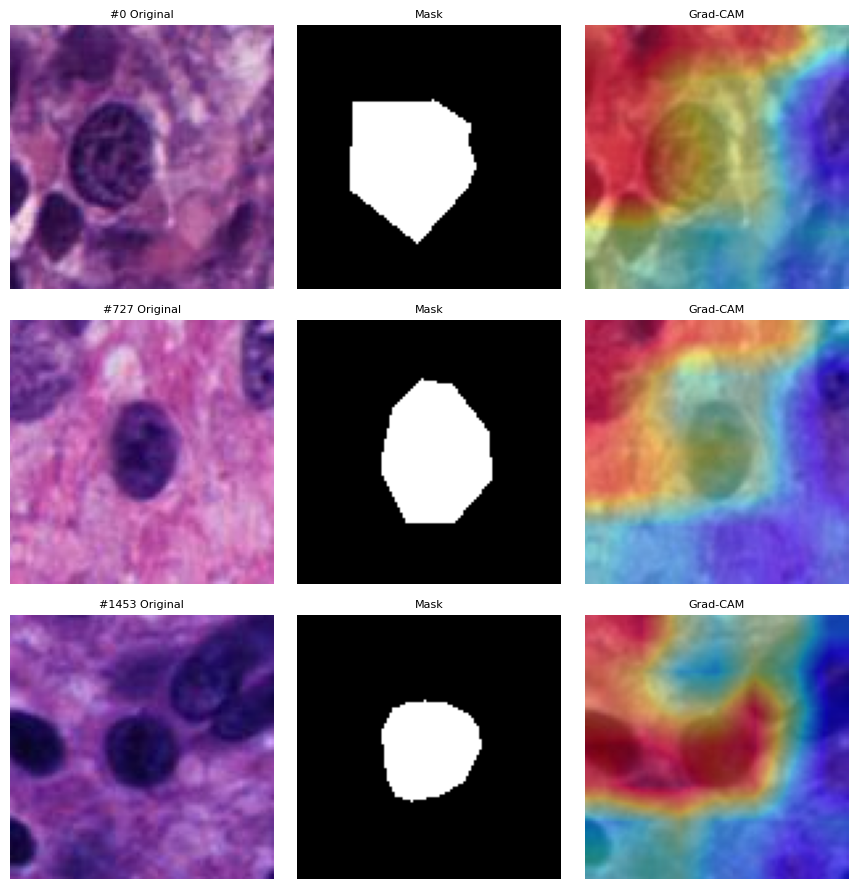

In [28]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM
from torchvision import transforms
import types, sys

# ─── Patch cv2 for pytorch_grad_cam compatibility ───────────────────────────────
cv2 = types.ModuleType("cv2")
def _resize(img, size):
    arr = (img*255).astype(np.uint8) if img.dtype in (np.float32, np.float64) else img
    pil = transforms.ToPILImage()(arr).resize((size[1], size[0]), resample=transforms.InterpolationMode.BILINEAR)
    out = np.array(pil)
    return (out.astype(np.float32)/255.0) if img.dtype in (np.float32, np.float64) else out
cv2.resize        = _resize
cv2.applyColorMap = lambda img, cmap: np.stack([img, img, img], axis=2)
cv2.cvtColor      = lambda img, code: img[..., ::-1]
cv2.COLORMAP_JET  = 2
cv2.COLOR_BGR2RGB = 4
sys.modules['cv2'] = cv2

# ─── Load model and checkpoint ─────────────────────────────────────────────────
# paper 1 : https://www.nature.com/articles/s41598-021-85652-1?fromPaywallRec=false
class MitosResCNN(nn.Module):
    def __init__(self):
        super(MitosResCNN, self).__init__()

        # Input layer
        self.input_conv = nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1)
        self.input_bn = nn.BatchNorm2d(32)

        # Block 1
        self.b1_conv1x1 = nn.Conv2d(32, 64, kernel_size=1, stride=1, padding=1)
        self.b1_bn1x1 = nn.BatchNorm2d(64)

        self.b1_conv1 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.b1_bn1 = nn.BatchNorm2d(64)
        self.b1_conv2 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.b1_bn2 = nn.BatchNorm2d(64)
        self.b1_conv3 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.b1_bn3 = nn.BatchNorm2d(64)

        self.b1_pool = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
        self.b1_final_conv = nn.Conv2d(64, 96, kernel_size=1, stride=1, padding=0)
        self.b1_final_bn = nn.BatchNorm2d(96)

        self.b1_skip_conv = nn.Conv2d(32, 96, kernel_size=1, stride=2, padding=0)
        self.b1_skip_bn = nn.BatchNorm2d(96)

        # Block 2
        self.b2_conv1 = nn.Conv2d(96, 96, kernel_size=3, stride=1, padding=1)
        self.b2_bn1 = nn.BatchNorm2d(96)
        self.b2_conv2 = nn.Conv2d(96, 96, kernel_size=3, stride=1, padding=1)
        self.b2_bn2 = nn.BatchNorm2d(96)
        self.b2_conv3 = nn.Conv2d(96, 96, kernel_size=3, stride=1, padding=1)
        self.b2_bn3 = nn.BatchNorm2d(96)

        self.b2_pool = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
        self.b2_final_conv = nn.Conv2d(96, 288, kernel_size=1, stride=1, padding=0)
        self.b2_final_bn = nn.BatchNorm2d(288)

        self.b2_skip_conv = nn.Conv2d(96, 288, kernel_size=1, stride=2, padding=0)
        self.b2_skip_bn = nn.BatchNorm2d(288)

        # Block 3
        self.b3_conv1 = nn.Conv2d(288, 288, kernel_size=3, stride=1, padding=1)
        self.b3_bn1 = nn.BatchNorm2d(288)
        self.b3_conv2 = nn.Conv2d(288, 288, kernel_size=3, stride=1, padding=1)
        self.b3_bn2 = nn.BatchNorm2d(288)
        self.b3_conv3 = nn.Conv2d(288, 288, kernel_size=3, stride=1, padding=1)
        self.b3_bn3 = nn.BatchNorm2d(288)

        self.b3_pool = nn.AvgPool2d(kernel_size=3, stride=2, padding=1)
        self.b3_final_conv = nn.Conv2d(288, 512, kernel_size=3, stride=1, padding=1)
        self.b3_final_bn = nn.BatchNorm2d(512)

        self.b3_skip_conv = nn.Conv2d(288, 512, kernel_size=1, stride=2, padding=0)
        self.b3_skip_bn = nn.BatchNorm2d(512)

        # Final layers
        self.global_pool = nn.AdaptiveAvgPool2d((4, 4))
        self.dropout1 = nn.Dropout(0.5)
        self.fc1 = nn.Linear(512 * 4 * 4, 150)
        self.dropout2 = nn.Dropout(0.5)
        self.bn1d = nn.BatchNorm1d(150)
        self.fc2 = nn.Linear(150, 2)

    def forward(self, x):
        # Input layer
        x = F.leaky_relu(self.input_bn(self.input_conv(x)), 0.1)

        # Block 1
        out = F.leaky_relu(self.b1_bn1x1(self.b1_conv1x1(x)), 0.1)
        out = F.leaky_relu(self.b1_bn1(self.b1_conv1(out)), 0.1)
        out = F.leaky_relu(self.b1_bn2(self.b1_conv2(out)), 0.1)
        out = F.leaky_relu(self.b1_bn3(self.b1_conv3(out)), 0.1)
        out = self.b1_pool(out)
        out = F.leaky_relu(self.b1_final_bn(self.b1_final_conv(out)), 0.1)

        skip = self.b1_skip_bn(self.b1_skip_conv(x))
        if out.shape != skip.shape:
            skip = F.interpolate(skip, size=out.shape[2:], mode="bilinear", align_corners=False)
        x = F.leaky_relu(out + skip, 0.1)

        # Block 2
        out = F.leaky_relu(self.b2_bn1(self.b2_conv1(x)), 0.1)
        out = F.leaky_relu(self.b2_bn2(self.b2_conv2(out)), 0.1)
        out = F.leaky_relu(self.b2_bn3(self.b2_conv3(out)), 0.1)
        out = self.b2_pool(out)
        out = F.leaky_relu(self.b2_final_bn(self.b2_final_conv(out)), 0.1)

        skip = self.b2_skip_bn(self.b2_skip_conv(x))
        if out.shape != skip.shape:
            skip = F.interpolate(skip, size=out.shape[2:], mode="bilinear", align_corners=False)
        x = F.leaky_relu(out + skip, 0.1)

        # Block 3
        out = F.leaky_relu(self.b3_bn1(self.b3_conv1(x)), 0.1)
        out = F.leaky_relu(self.b3_bn2(self.b3_conv2(out)), 0.1)
        out = F.leaky_relu(self.b3_bn3(self.b3_conv3(out)), 0.1)
        out = self.b3_pool(out)
        out = F.leaky_relu(self.b3_final_bn(self.b3_final_conv(out)), 0.1)

        skip = self.b3_skip_bn(self.b3_skip_conv(x))
        if out.shape != skip.shape:
            skip = F.interpolate(skip, size=out.shape[2:], mode="bilinear", align_corners=False)
        x = F.leaky_relu(out + skip, 0.1)

        # Final layers
        x = self.global_pool(x)
        x = x.view(x.size(0), -1)
        x = self.dropout1(x)
        x = self.fc1(x)
        x = self.dropout2(x)
        x = self.bn1d(x)
        x = self.fc2(x)
        return x

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MitosResCNN().to(DEVICE).eval()

ckpt_path = "runs_MitosResCNN_200/fold1_best.pth"  # update path as needed
state = torch.load(ckpt_path, map_location=DEVICE)
model.load_state_dict(state,strict=False)

# ─── Select target layer for Grad-CAM ─────────────────────────────────────────
# Use the final convolution of block 3
target_layer = model.b3_final_conv

# ─── Load some sample images from train.pt ─────────────────────────────────────
imgs, masks, labels = torch.load("saved_datasets/train/train.pt", map_location="cpu")
sample_idxs = [0, len(imgs)//2, len(imgs)-1]  # first, middle, last

# ─── Prepare plotting ──────────────────────────────────────────────────────────
n = len(sample_idxs)
fig, axes = plt.subplots(n, 3, figsize=(9, 3*n))
plt.subplots_adjust(hspace=0.4, wspace=0.2)

for i, idx in enumerate(sample_idxs):
    img = imgs[idx]
    mask = masks[idx].squeeze(0).numpy()
    rgb = img.permute(1,2,0).numpy()
    rgb_norm = (rgb - rgb.min())/(rgb.max() - rgb.min())

    # Plot original image
    ax = axes[i, 0]
    ax.imshow(rgb_norm)
    ax.set_title(f"#{idx} Original", fontsize=8)
    ax.axis("off")

    # Plot mask
    ax = axes[i, 1]
    ax.imshow(mask, cmap="gray")
    ax.set_title("Mask", fontsize=8)
    ax.axis("off")

    # Apply Grad-CAM
    input_tensor = img.unsqueeze(0).to(DEVICE)
    cam = GradCAM(model=model, target_layers=[target_layer])
    grayscale_cam = cam(input_tensor=input_tensor)[0]  # H×W

    jet = plt.get_cmap("jet")(grayscale_cam)[...,:3]
    overlay = rgb_norm * 0.5 + jet * 0.5

    # Plot Grad-CAM overlay
    ax = axes[i, 2]
    ax.imshow(overlay)
    ax.set_title("Grad-CAM", fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.show()


In [1]:
import os
import random
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import TensorDataset, DataLoader, Subset
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import classification_report, confusion_matrix
from torchvision import transforms
import torchvision.transforms.functional as TF
import timm

In [9]:
# ──────────────────────────────────────────────────────────────────────────────
# CELL: 5-fold CV + hold-out test using Augmented train.pt → paper settings
# ──────────────────────────────────────────────────────────────────────────────
import os, random, numpy as np, torch, tqdm
from torch import nn, optim
from torch.utils.data import TensorDataset, DataLoader, Subset
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import classification_report, confusion_matrix
import timm
from torchvision import transforms
import torchvision.transforms.functional as TF

# ─── disable HF & tqdm progress bars ───────────────────────────────────────────
os.environ["HF_HUB_DISABLE_PROGRESS_BARS"] = "1"
tqdm.tqdm = lambda it, *a, **k: (x for x in (it or []))

# ─── HYPERPARAMS & DEVICE ──────────────────────────────────────────────────────
SEED         = 42
ROT_MAX      = 30
TRANS_MAX    = 10
DO_AUG       = True
LR           = 1e-4
WEIGHT_DECAY = 1e-6
BATCH_SIZE   = 32
EPOCHS       = 5
FOLDS        = 5
OUT_DIR      = "runs_convnextv2_tiny_5"
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
os.makedirs(OUT_DIR, exist_ok=True)

# ─── DATA LOAD & AUGMENT ───────────────────────────────────────────────────────

# indices = np.arange(len(full_ds))

# ─── HOLD-OUT TEST SPLIT ────────────────────────────────────────────────────────
trainval_idx, test_idx = train_test_split(
    indices, test_size=0.10, random_state=SEED, stratify=all_lbls.numpy()
)
test_loader = DataLoader(Subset(full_ds, test_idx), batch_size=BATCH_SIZE, shuffle=False)

# ─── MODEL FACTORY ────────────────────────────────────────────────────────────
def make_model():
    backbone = timm.create_model(
        "convnextv2_tiny.fcmae_ft_in22k_in1k",
        pretrained=True,
        num_classes=0
    )
    head = nn.Linear(backbone.num_features, 2)
    return nn.Sequential(backbone, head).to(DEVICE)

# ─── 5-FOLD TRAIN/VAL ─────────────────────────────────────────────────────────
kf = KFold(n_splits=FOLDS, shuffle=True, random_state=SEED)
best_ckpt = None

for fold, (tr_f, va_f) in enumerate(kf.split(trainval_idx), 1):
    tr_idx, va_idx = trainval_idx[tr_f], trainval_idx[va_f]
    print(f"\nFold {fold}/{FOLDS} — train={len(tr_idx)} val={len(va_idx)} test={len(test_idx)}")

    tr_loader = DataLoader(Subset(full_ds, tr_idx), batch_size=BATCH_SIZE, shuffle=True)
    va_loader = DataLoader(Subset(full_ds, va_idx), batch_size=len(va_idx), shuffle=False)

    model     = make_model().train()
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=5, eta_min=1e-6)

    best_val_acc = 0.0
    fold_history = []

    for ep in range(1, EPOCHS+1):
        # — train —
        run_loss = run_corr = run_n = 0
        for xb, yb in tr_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            logits = model(xb)
            loss   = criterion(logits, yb)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            preds = logits.argmax(1)
            bs    = xb.size(0)
            run_loss += loss.item() * bs
            run_corr += (preds == yb).sum().item()
            run_n   += bs

        train_loss = run_loss / run_n
        train_acc  = run_corr / run_n

        # — validate —
        model.eval()
        corr = tot = 0
        with torch.no_grad():
            for xb, yb in va_loader:
                xb, yb = xb.to(DEVICE), yb.to(DEVICE)
                out    = model(xb).argmax(1)
                corr  += (out == yb).sum().item()
                tot   += xb.size(0)
        val_acc = corr / tot

        # — record & print —
        fold_history.append({
            "epoch":      ep,
            "train_loss": train_loss,
            "train_acc":  train_acc,
            "val_acc":    val_acc
        })
        print(f"Ep{ep:02d} tr_acc={train_acc:.4f} val_acc={val_acc:.4f}", end="\r")

        # — save best model —
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_ckpt    = os.path.join(OUT_DIR, f"fold{fold}_best.pth")
            torch.save(model.state_dict(), best_ckpt)

        model.train()
        scheduler.step(ep)

    print(f"\n→ Fold {fold} best-val_acc={best_val_acc:.4f}")

    # ─── dump history to CSV ───────────────────────────────────────────────────
    hist_df  = pd.DataFrame(fold_history)
    hist_path = os.path.join(OUT_DIR, f"fold{fold}_history.csv")
    hist_df.to_csv(hist_path, index=False)
    print(f"→ Fold {fold} history saved: {hist_path}")

# ─── HOLD-OUT TEST ─────────────────────────────────────────────────────────────
print(f"\nLoading best model from: {best_ckpt}")
model = make_model().eval()
model.load_state_dict(torch.load(best_ckpt, map_location=DEVICE))

all_preds, all_labels, tot_loss = [], [], 0.0
with torch.no_grad():
    for xb, yb in test_loader:
        xb, yb  = xb.to(DEVICE), yb.to(DEVICE)
        logits  = model(xb)
        tot_loss += criterion(logits, yb).item() * xb.size(0)
        all_preds.extend(logits.argmax(1).cpu().tolist())
        all_labels.extend(yb.cpu().tolist())

print(f"\nTest Loss: {tot_loss/len(test_idx):.4f}")
print("Classification Report:\n",
      classification_report(all_labels, all_preds, target_names=["Class 0","Class 1"]))
print("Confusion Matrix:\n",
      confusion_matrix(all_labels, all_preds))


Fold 1/5 — train=2093 val=524 test=291
Ep05 tr_acc=0.9995 val_acc=0.9847
→ Fold 1 best-val_acc=0.9847
→ Fold 1 history saved: paper_convnextv2_tiny/fold1_history.csv

Fold 2/5 — train=2093 val=524 test=291
Ep05 tr_acc=0.9995 val_acc=0.9924
→ Fold 2 best-val_acc=0.9924
→ Fold 2 history saved: paper_convnextv2_tiny/fold2_history.csv

Fold 3/5 — train=2094 val=523 test=291
Ep05 tr_acc=1.0000 val_acc=0.9924
→ Fold 3 best-val_acc=0.9962
→ Fold 3 history saved: paper_convnextv2_tiny/fold3_history.csv

Fold 4/5 — train=2094 val=523 test=291
Ep05 tr_acc=1.0000 val_acc=0.9962
→ Fold 4 best-val_acc=0.9981
→ Fold 4 history saved: paper_convnextv2_tiny/fold4_history.csv

Fold 5/5 — train=2094 val=523 test=291
Ep05 tr_acc=1.0000 val_acc=0.9924
→ Fold 5 best-val_acc=0.9943
→ Fold 5 history saved: paper_convnextv2_tiny/fold5_history.csv

Loading best model from: paper_convnextv2_tiny/fold5_best.pth

Test Loss: 0.0418
Classification Report:
               precision    recall  f1-score   support

    

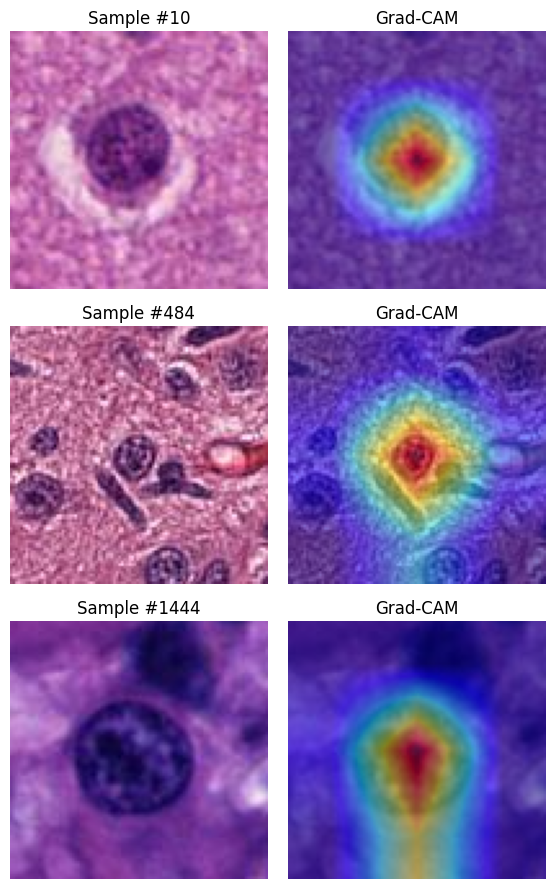

In [7]:
import os
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM
from torchvision import transforms
import types, sys
import timm


# ─── Parameters ───────────────────────────────────────────────────────────────
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CKPT_PATH  = "runs_convnextv2_tiny_5/fold1_best.pth"
IMG_TENSOR = "saved_datasets/train/train.pt"

# ─── Model Definition ─────────────────────────────────────────────────────────
def make_model_for_gradcam():
    backbone = timm.create_model(
        "convnextv2_tiny.fcmae_ft_in22k_in1k",
        pretrained=False,
        num_classes=0
    )
    head = nn.Linear(backbone.num_features, 2)
    return nn.Sequential(backbone, head).to(DEVICE)

# ─── Load model & checkpoint ───────────────────────────────────────────────────
model = make_model_for_gradcam().eval()
state = torch.load(CKPT_PATH, map_location=DEVICE)
model.load_state_dict(state)

# ─── Extract backbone and select target layer ─────────────────────────────────
backbone     = model[0]  # first element of the Sequential
target_layer = backbone.stages[3].blocks[-1].conv_dw  # last block’s depthwise conv

# ─── Load sample data ──────────────────────────────────────────────────────────
imgs, masks, labels = torch.load(IMG_TENSOR, map_location="cpu")
sample_idxs = [10, len(imgs)//3, len(imgs)-10]

# ─── Plot Grad-CAM ─────────────────────────────────────────────────────────────
n = len(sample_idxs)
fig, axes = plt.subplots(n, 2, figsize=(6, 3*n))
plt.subplots_adjust(hspace=0.4)

for i, idx in enumerate(sample_idxs):
    img = imgs[idx]
    rgb = img.permute(1,2,0).numpy()
    rgb_norm = (rgb - rgb.min()) / (rgb.max() - rgb.min())

    # Original
    ax = axes[i, 0]
    ax.imshow(rgb_norm)
    ax.set_title(f"Sample #{idx}")
    ax.axis("off")

    # Grad-CAM
    input_tensor = img.unsqueeze(0).to(DEVICE)
    cam = GradCAM(model=model, target_layers=[target_layer])
    grayscale_cam = cam(input_tensor=input_tensor)[0]
    jet = plt.get_cmap("jet")(grayscale_cam)[...,:3]
    overlay = rgb_norm * 0.5 + jet * 0.5

    ax = axes[i, 1]
    ax.imshow(overlay)
    ax.set_title("Grad-CAM")
    ax.axis("off")

plt.tight_layout()
plt.show()
